In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys

sys.path.append('/app/SimVPv2')
import numpy as np
import xarray as xr
import torch
import pandas as pd
import lovely_tensors as lt
from simvp.models import SimVP_Model
from tqdm.auto import tqdm
from PIL import Image
import matplotlib.pyplot as plt
from simvp.datasets.dataloader_KD import ZsdDataset

lt.monkey_patch()

In [3]:
# train_time=['1997', '2020']
# train_set = ZsdDataset(data_dir='/app/data/', training_time=train_time)

In [4]:
    # dataloader_train = torch.utils.data.DataLoader(train_set,
    #                                                batch_size=batch_size, shuffle=True,
    #                                                pin_memory=True, drop_last=True,
    #                                                # num_workers=num_workers)

In [5]:
def drop_last_column_if_odd(data):
    lat_size = data.lat.size
    lon_size = data.lon.size

    lat_slice = slice(None, -1) if lat_size % 2 != 0 else slice(None)
    lon_slice = slice(None, -1) if lon_size % 2 != 0 else slice(None)

    return data.isel(lat=lat_slice, lon=lon_slice)

In [6]:
dataset = xr.open_mfdataset('/app/data/*2021*.nc', combine='by_coords')[['ZSD', 'CHL', 'KD490']]
AVG_NAN_COUNT = 33659
threshold = AVG_NAN_COUNT * 1.1
missing_values_count = dataset['ZSD'].isnull().sum(dim=['lon', 'lat'])
timestamps_below_threshold = (missing_values_count < threshold)
print(f'Filtered {timestamps_below_threshold.values.sum()}/{len(timestamps_below_threshold.values)}')
dataset = dataset.where(timestamps_below_threshold, drop=True)

Filtered 1475/1956


In [7]:
val_data = dataset.sel(time=slice('2022-01-01', '2023-01-01'))
val_data

<xarray.Dataset>
Dimensions:  (time: 276, lat: 337, lon: 384)
Coordinates:
  * time     (time) datetime64[ns] 2022-02-04 2022-02-05 ... 2022-11-06
  * lat      (lat) float32 62.02 61.98 61.94 61.9 ... 48.15 48.1 48.06 48.02
  * lon      (lon) float32 -11.98 -11.94 -11.9 -11.85 ... 3.896 3.938 3.979
Data variables:
    ZSD      (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
    CHL      (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
    KD490    (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
Attributes: (12/92)
    lon_step:                        0.041666668
    keywords:                        EARTH SCIENCE > OCEANS > OCEAN CHEMISTRY...
    cmems_product_id:                OCEANCOLOUR_GLO_BGC_L4_MY_009_104
    lat_step:                        0.041666668
    grid_mapping:                    Equirectangular
    title:                           cmems_obs-oc_glo_bgc-plankton_my_l4-gapf...
    ...                              ...
    westernmost_longitude:           -180.0
    geospatial_vertical_positive:    up
    date_created:                    2023-05-17T00:20:49Z
    nb_valid_bins:                   19022444
    pct_valid_bins:                  50.9646240569273
    History:                         Translated to CF-1.0 Conventions by Netc...

In [8]:
device = 'cuda:0'

In [9]:
import json
def load_model(dtype):
    model_path = '/app/results/'
    in_shape = (10, 1, 32, 64)
    if dtype == 'zsd':
        model_path = model_path+'zsd_solo/'
    elif dtype == 'zsd_big':
        model_path = model_path+'zsd_big/'
    elif dtype == 'zsdchl':
        model_path = model_path+'zsd_chl/'
        in_shape = (10, 2, 32, 64)
    elif dtype == 'zsdkd':
        model_path = model_path+'zsd_kd/'
        in_shape = (10, 2, 32, 64)
    elif dtype == 'zsdchlkd':
        model_path = model_path+'zsd_chl_kd/'
        in_shape = (10, 3, 32, 64)
    f = open (model_path+'model_param.json', "r")
    model_params = json.loads(f.read())
    model = SimVP_Model(in_shape, hid_S=model_params['hid_S'], hid_T=model_params['hid_T'], N_S=model_params['N_S'], N_T=model_params['N_T'])
    model_dict = torch.load(model_path+'/checkpoints/latest.pth')
    model.load_state_dict(model_dict['state_dict'])
    print(model_path, "model.", model_dict['epoch'], 'epoch. Loaded.')
    model.to(device)
    
    return model

In [10]:
def normalize_zsd(data, denormalize=False, dtype='zsd', 
    zsd_mean=13.446109, zsd_std=6.367626, chl_mean=0.9055, chl_std=1.4449, kd_mean = 0.08089,kd_std=0.0521):
    if denormalize:
        data = data*zsd_std+zsd_mean
        return data
    if dtype == 'zsd' or dtype == 'zsd_big':
        data = (data - zsd_mean) / zsd_std
        return data
    if dtype == 'zsdchl':
        data[:,0,...] = (data[:,0,...] - zsd_mean) / zsd_std
        data[:,1,...] = (data[:,1,...] - chl_mean) / chl_std
        return data
    if dtype == 'zsdkd':
        data[:,0,...] = (data[:,0,...] - zsd_mean) / zsd_std
        data[:,1,...] = (data[:,1,...] - kd_mean) / kd_std
        return data
    if dtype == 'zsdchlkd':
        data[:,0,...] = (data[:,0,...] - zsd_mean) / zsd_std
        data[:,1,...] = (data[:,1,...] - chl_mean) / chl_std
        data[:,2,...] = (data[:,2,...] - kd_mean) / kd_std
        return data

In [12]:
import torch.nn.functional as F

mask = torch.tensor(np.array(Image.open("/app/data/surface_mask.png"))[...,0] / 255.).to(torch.uint8).to(device)[None]
def calc_rmse(y_gt, y_pred):
    # mask = y_gt > 0
    rmse = F.mse_loss(y_pred[mask], y_gt[mask]).sqrt().item()
    return rmse
def calc_rrmse(y_gt, y_pred):
    # mask = y_gt > 0
    rmse = F.mse_loss(y_pred[mask], y_gt[mask]).sqrt().item()
    mean_true = torch.mean(y_gt[mask])

    rrmse = rmse / mean_true
    return rrmse.item()

In [13]:
def get_forecast(x, model, patch_size=(32,64), mean=13.446109, std=6.367626): # x: 10, 337, 384
    _, C, H, W = x.size()
    num_patches_h = H // patch_size[0]
    num_patches_w = W // patch_size[1]
    last_h_patch = num_patches_h != H / patch_size[0]
    last_w_patch = num_patches_w != W / patch_size[1]
    mask = torch.tensor(np.array(Image.open("/app/data/surface_mask.png"))[...,0] / 255.).to(device)
    
    # Output storage
    output = torch.zeros((1, H, W)).to(device)
    half_patch_h = H -(num_patches_h * patch_size[0])
    half_patch_w = W -(num_patches_w * patch_size[1])
    num_patches_h += last_h_patch
    num_patches_w += last_w_patch
    # Inference
    model.eval()
    with torch.inference_mode():
        for i in range(num_patches_h):
            for j in range(num_patches_w):
                if last_h_patch and i == num_patches_h-1:
                    patch = x[:, :, H-patch_size[0]:H, j*patch_size[1]:(j+1)*patch_size[1]]
                elif last_w_patch and i == num_patches_w-1:
                    patch = x[:, :, i*patch_size[0]:(i+1)*patch_size[0], W-patch_size[1]:W]
                else:
                    patch = x[:, :, i*patch_size[0]:(i+1)*patch_size[0], j*patch_size[1]:(j+1)*patch_size[1]]
                    
                if patch.eq(-777).all():
                    result = torch.zeros(patch_size)
                else:
                    result = model(patch[None])[:, :1]
                if last_h_patch and i == num_patches_h-1:
                    output[:, H-half_patch_h:H, j*patch_size[1]:(j+1)*patch_size[1]] = result.squeeze()[patch_size[0] - half_patch_h:, :]
                elif last_w_patch and i == num_patches_w-1:
                    output[:, i*patch_size[0]:(i+1)*patch_size[0], W-half_patch_w:W] = result.squeeze()[:, path_size[1] - half_patch_w:]
                else:
                    output[:, i*patch_size[0]:(i+1)*patch_size[0], j*patch_size[1]:(j+1)*patch_size[1]] = result.squeeze()
    
    output = normalize_zsd(output, denormalize=True)
    output = output * mask
    return output

In [14]:
def get_testpoint(dtype, i):
    if dtype == 'zsd' or dtype == 'zsd_big':
        test_point = torch.tensor(val_data['ZSD'].values[i:i+11]).to(device).unsqueeze(1)
    if dtype == 'zsdchl':
        zsd = torch.tensor(val_data['ZSD'].values[i:i+11]).to(device).unsqueeze(1)
        chl = torch.tensor(val_data['CHL'].values[i:i+11]).to(device).unsqueeze(1)
        test_point=torch.cat([zsd, chl], dim=1)
    if dtype == 'zsdkd':
        zsd = torch.tensor(val_data['ZSD'].values[i:i+11]).to(device).unsqueeze(1)
        kd = torch.tensor(val_data['KD490'].values[i:i+11]).to(device).unsqueeze(1)
        test_point=torch.cat([zsd, kd], dim=1)
    if dtype == 'zsdchlkd':
        zsd = torch.tensor(val_data['ZSD'].values[i:i+11]).to(device).unsqueeze(1)
        chl = torch.tensor(val_data['CHL'].values[i:i+11]).to(device).unsqueeze(1)
        kd = torch.tensor(val_data['KD490'].values[i:i+11]).to(device).unsqueeze(1)
        test_point=torch.cat([zsd, chl, kd], dim=1)
    x_point = normalize_zsd(test_point[:10], dtype=dtype)
    x_point = torch.nan_to_num(x_point, nan=-777)
    y_point = test_point[-1, 0][None]
    
    return x_point, y_point

In [15]:
def validate_all():
    methods = ['zsd', 'zsd_big', 'zsdchl', 'zsdkd']#, 'zsdchlkd']
    res = {}
    for dtype in methods:
        results = []
        rmses = []
        rrmses = []
        pred = []
        true = []
        model = load_model(dtype)
        for i in tqdm(range(len(val_data.time)-11)):
            x_point, y_point = get_testpoint(dtype, i)
            out = get_forecast(x_point, model).cpu()
            rmse = calc_rmse(y_point.cpu(), out)
            rrmse = calc_rrmse(y_point.cpu(), out)
            rmses.append(rmse)
            rrmses.append(rrmse)
            pred.append(out)
            true.append(y_point)
        res[dtype] = {'rmse': rmses, 'rrmse':rrmses, 'pred':pred, 'true':true}
        print(f'|{dtype}| rmse:{np.array(rmses).mean():.4f}', f'relative rmse:{np.array(rrmses).mean():.4f}')
    return res

In [14]:
import time
def validate_inference_time(break_point=10, device=device):
    methods = ['zsd', 'zsd_big', 'zsdchl', 'zsdkd']#, 'zsdchlkd']
    res = {}
    for dtype in methods:
        inf_time = []
        model = load_model(dtype).to(device)
        for i in tqdm(range(len(val_data.time)-11)):
            x_point, y_point = get_testpoint(dtype, i)
            start_time = time.time()
            out = get_forecast(x_point.to(device), model)
            elapsed_time = time.time() - start_time
            inf_time.append(elapsed_time)
            if i == break_point:
                break
        res[dtype] = np.array(inf_time).mean()
    return res

In [18]:
inference_result = validate_inference_time(device=device)

/app/results/zsd_solo/ model. 29 epoch. Loaded.


  0%|          | 0/265 [00:00<?, ?it/s]

/app/results/zsd_big/ model. 29 epoch. Loaded.


  0%|          | 0/265 [00:00<?, ?it/s]

/app/results/zsd_chl/ model. 55 epoch. Loaded.


  0%|          | 0/265 [00:00<?, ?it/s]

/app/results/zsd_kd/ model. 54 epoch. Loaded.


  0%|          | 0/265 [00:00<?, ?it/s]

In [16]:
# /app/results/zsd_solo/ model. 29 epoch. Loaded.
# 10/265 [00:26<09:31, 2.24s/it]
# /app/results/zsd_big/ model. 29 epoch. Loaded.
# 10/265 [00:34<13:22, 3.15s/it]
# /app/results/zsd_chl/ model. 55 epoch. Loaded.
# 10/265 [00:51<19:37, 4.62s/it]
# /app/results/zsd_kd/ model. 54 epoch. Loaded.
# 10/265 [00:52<19:44, 4.65s/it]

In [345]:
inference_result

{'zsd': 4.997625155882402,
 'zsd_big': 15.195323293859309,
 'zsdchl': 5.0387936722148545,
 'zsdkd': 5.124337131326849}

In [ ]:
results = validate_all()

/app/results/zsd_solo/ model. 29 epoch. Loaded.


  0%|          | 0/265 [00:00<?, ?it/s]

|zsd| rmse:nan relative rmse:nan
/app/results/zsd_big/ model. 29 epoch. Loaded.


  0%|          | 0/265 [00:00<?, ?it/s]

In [19]:
torch.save(results, 'model_eval_results.pth')

In [18]:
results

{'zsd': {'rmse': [2.8091612514120645,
   1.7843870294148758,
   2.2762430765523907,
   2.070928144613984,
   2.4645778904174405,
   2.6265764659290585,
   2.36576612769575,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   

In [20]:
results.keys()

dict_keys(['zsd', 'zsd_big', 'zsdchl', 'zsdkd'])

In [24]:
zsd_preds = torch.cat(results['zsd']['pred'], dim=0)

In [25]:
mask

tensor[1, 337, 384] u8 n=129408 x∈[0, 1] μ=0.739 σ=0.439 cuda:0

In [ ]:
rmse = (rmse_t * mask)[mask & (rmse_t > -777)].mean()

In [68]:
for model in results.keys():
    errors = {}
    pred = torch.cat(results[model]['pred'], dim=0).cpu()
    true = torch.cat(results[model]['true'], dim=0).cpu()
    rmse_t = ((true - pred) ** 2).sqrt().mean(dim=0).cpu()
    # error_global_maps[model] = (rmse_t)
    print(F.mse_loss(true[(true > 0) & (mask.repeat(265,1,1).cpu())], pred[(true > 0) & (mask.repeat(265,1,1).cpu())]).sqrt().item())
    print(rmse_t[rmse_t > 0].mean().item())
    rmse_t = torch.nan_to_num(rmse_t, nan=-777)
    print(f'Regional evaluation of {model}:')
    rmse = rmse_t[(mask[0].cpu()) & (rmse_t > -777)].mean()
    # errors[region_id] = rmse
    print(f'For {model} rmse is {rmse}')
    # error_region_maps[model] = create_location_based_error_map(errors, region_mask, mask)

2.283322992302248
1.6140333195163332
Regional evaluation of zsd:
For zsd rmse is 1.6101022664655014
2.3222045952766295
1.659804937031298
Regional evaluation of zsd_big:
For zsd_big rmse is 1.65592559682978
2.2208989221086552
1.5481407112167571
Regional evaluation of zsdchl:
For zsdchl rmse is 1.5441352125878818
2.2283726557656083
1.5787209434793004
Regional evaluation of zsdkd:
For zsdkd rmse is 1.5747499944475076


In [62]:
a = torch.tensor([[[12, 12], [10,10]],[[13, 13], [11,11]]]) * 1.
b = torch.tensor([[[22, 22], [15,15]],[[21, 21], [14,14]]]) * 1.
a, b

(tensor[2, 2, 2] n=8 x∈[10.000, 13.000] μ=11.500 σ=1.195 [[[12.000, 12.000], [10.000, 10.000]], [[13.000, 13.000], [11.000, 11.000]]],
 tensor[2, 2, 2] n=8 x∈[14.000, 22.000] μ=18.000 σ=3.780 [[[22.000, 22.000], [15.000, 15.000]], [[21.000, 21.000], [14.000, 14.000]]])

In [69]:
# ((a-b) ** 2).mean(dim=0).sqrt()

In [70]:
# ((a-b) ** 2).sqrt().mean(dim=0)

In [50]:
pred[0][:5,:5].v

tensor[5, 5] f64 n=25 x∈[31.606, 33.000] μ=32.318 σ=0.386
tensor([[31.7389, 32.4027, 32.5557, 32.6581, 32.2169],
        [31.8385, 32.4878, 32.6698, 33.0001, 32.6000],
        [32.1432, 32.5137, 32.6675, 32.8794, 32.4776],
        [32.5812, 32.5686, 32.1908, 32.3370, 32.4198],
        [31.6061, 31.7320, 31.7601, 31.9600, 31.9464]], dtype=torch.float64)

In [51]:
true[0][:5,:5].v

tensor[5, 5] n=25 x∈[30.102, 32.296] μ=31.387 σ=0.516
tensor([[31.4705, 31.6846, 31.8443, 31.9698, 32.2956],
        [31.4587, 31.5860, 31.6528, 31.6977, 31.6843],
        [31.0171, 31.0801, 31.5737, 31.5565, 31.5522],
        [30.1199, 30.9650, 30.9407, 31.5132, 31.4341],
        [31.2030, 32.0019, 30.9019, 30.1015, 31.3740]])

In [30]:
rmse_t

tensor[337, 384] f64 n=129408 x∈[-777.000, 9.432] μ=-201.198 σ=341.732

In [ ]:
# /app/results/zsd_solo/ model. 29 epoch. Loaded.
# |zsd| rmse:2.2400 relative rmse:0.1859

# /app/results/zsd_big/ model. 10 epoch. Loaded.
# |zsd_big| rmse:2.2739 relative rmse:0.1889

# /app/results/zsd_chl/ model. 55 epoch. Loaded.
# |zsdchl| rmse:2.1801 relative rmse:0.1811

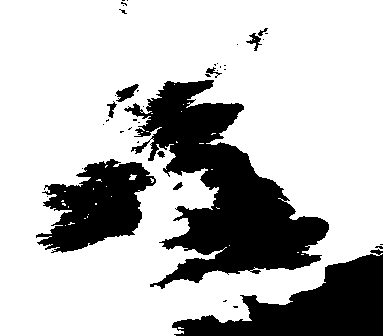

In [97]:
torch.tensor(val_data['ZSD'].values[10])[None].repeat(3,1,1).rgb

# Evaluation

## Metrics setup
- rmse
- rrmse

In [24]:
mask = torch.tensor(np.array(Image.open("/app/data/surface_mask.png"))[...,0] / 255.).to(torch.uint8).to(device)[None]
def calc_rmse(y_pred, y_gt):
    rmse = F.mse_loss(y_pred[mask], y_gt[mask]).sqrt().item()
    print(F.mse_loss(y_pred[mask], y_gt[mask]))
    return rmse
def calc_rrmse(y_pred, y_gt):
    rmse = F.mse_loss(y_pred[mask], y_gt[mask]).sqrt().item()
    mean_true = torch.mean(y_gt[mask])

    rrmse = rmse / mean_true
    return rrmse

## Descriptive Characteristics:
- Distance to coastline
- Month / Season
- Average depth in this month
- Location (split on areas) eg. Atlantic ocean, North sea, Celtic sea, English channel, Irish sea

### 1. Distance to coasline

In [132]:
import torch
from scipy.ndimage import distance_transform_edt

def distance_to_coast(mask):
    # Here we assume that 1 corresponds to ocean and 0 to coast in your binary mask.
    # We also assume the mask is a 2D numpy array.
    
    # Compute the distance transform
    if type(mask) == torch.Tensor:
        mask = mask.cpu().numpy()
    
    
    dist_transform = distance_transform_edt(mask)
    
    # Convert to a PyTorch tensor
    dist_transform_torch = torch.from_numpy(dist_transform).to(device) * 4
    
    return dist_transform_torch

In [133]:
dists = distance_to_coast(mask)
dists

tensor[1, 337, 384] f64 n=129408 x∈[0., 532.376] μ=109.912 σ=125.385 cuda:0

In [163]:
x = torch.cat(results['zsd']['pred'], dim=0)#.mean(dim=0)
x

tensor[265, 337, 384] f64 n=34293120 x∈[-0.465, 36.268] μ=8.778 σ=7.230

In [164]:
y = torch.cat(results['zsd']['true'], dim=0).cpu()#.mean(dim=0).cpu()
y

tensor[265, 337, 384] n=34293120 x∈[1.324, 39.100] μ=12.179 σ=6.081 NaN!

In [ ]:
err = ((x-y)**2).sqrt()
err = torch.nan_to_num(err, 0)
err

tensor[337, 384] f64 n=129408 x∈[0., 9.432] μ=0.253 σ=0.314

In [161]:
# Reshape tensors into 1D arrays.
A_flat = err[mask[0]]
B_flat = dists[mask].cpu()

# Calculate means.
mean_A = A_flat.mean()
mean_B = B_flat.mean()

# Center the data.
A_centered = A_flat - mean_A
B_centered = B_flat - mean_B

# Calculate correlation.
correlation = (A_centered * B_centered).sum() / (A_centered.norm() * B_centered.norm())

In [162]:
correlation

tensor f64 -0.422

In [173]:
mean_err = ((x - y) ** 2).sqrt()
mean_err = torch.nan_to_num(mean_err, 0) * mask.cpu()
mean_err = mean_err.mean(dim=0)
mean_err

tensor[337, 384] f64 n=129408 x∈[0., 4.032] μ=1.190 σ=0.766

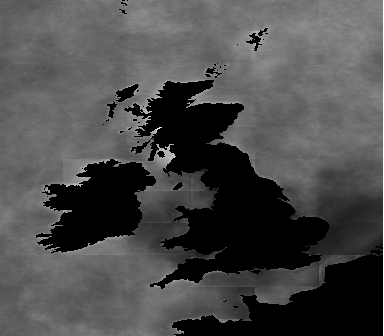

In [174]:
(mean_err[None]/mean_err.max()).repeat(3,1,1).rgb

In [ ]:
for _map in error_region_maps.keys():
    data = (((error_region_maps[_map] * 1.)/error_region_maps[_map].max()))[0].cpu().numpy()

    fig, ax = plt.subplots(figsize=(12, 8))

    # Generate the heatmap on this figure
    sns.heatmap(data, cmap='YlGnBu', ax=ax)

    # Remove x and y coordinates grid
    ax.grid(False)
    ax.tick_params(left=False, bottom=False)
    ax.set(xticklabels=[], yticklabels=[], title=f"Errors by region. Model: {_map}")
    plt.savefig(f"{_map}_region_error.png", dpi=300, bbox_inches='tight')
    plt.show()

tensor[1, 337, 384] f64 n=129408 x∈[0., 4.032] μ=1.189 σ=0.766

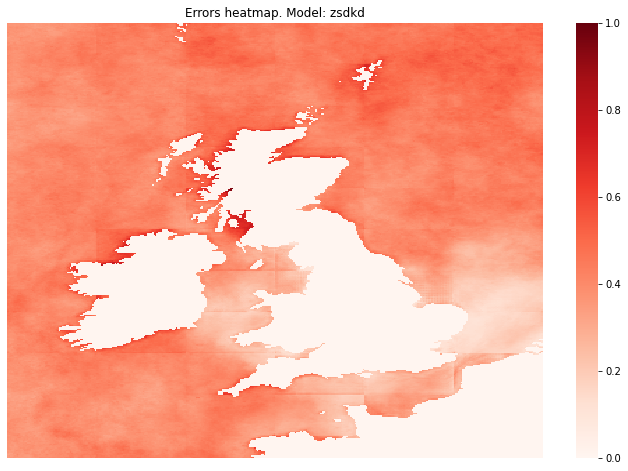

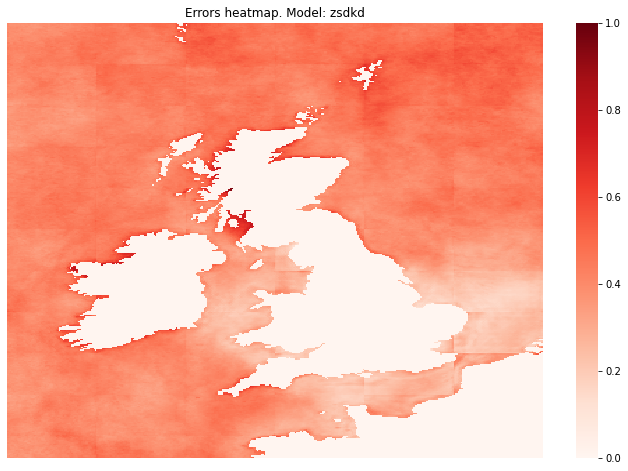

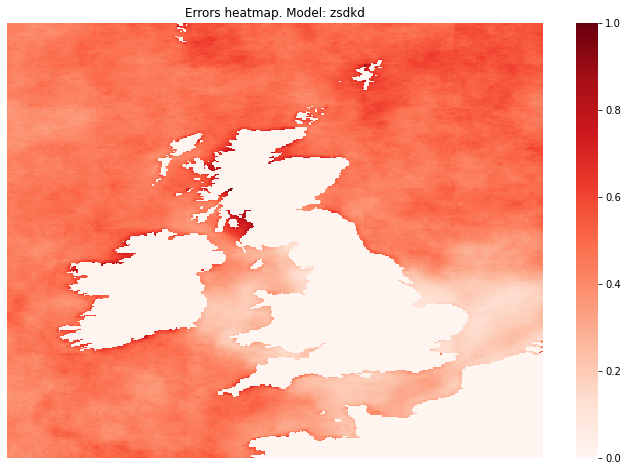

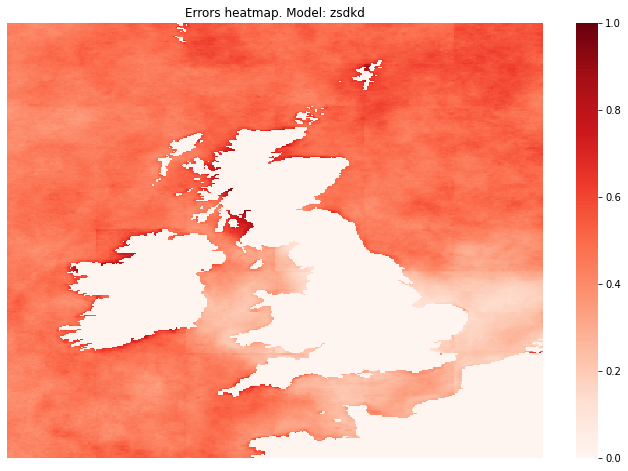

In [192]:
for model in error_global_maps.keys():
    fig, ax = plt.subplots(figsize=(12, 8))

    data = torch.nan_to_num(error_global_maps[model], 0) * mask.cpu()
    data = (data / data.max())[0].numpy()

    # Generate the heatmap on this figure
    sns.heatmap(data, cmap='Reds', ax=ax)

    # Remove x and y coordinates grid
    ax.grid(False)
    ax.tick_params(left=False, bottom=False)
    ax.set(xticklabels=[], yticklabels=[], title=f"Errors heatmap. Model: {_map}")
    plt.savefig(f"{model}_global_error.png", dpi=300, bbox_inches='tight')
    plt.show()

### 2.1 Month split

In [206]:
val_data

<xarray.Dataset>
Dimensions:     (time: 276, lat: 337, lon: 384, month_dim: 276, season_dim: 276)
Coordinates:
  * time        (time) datetime64[ns] 2021-02-04 2021-02-05 ... 2021-11-06
  * lat         (lat) float32 62.02 61.98 61.94 61.9 ... 48.15 48.1 48.06 48.02
  * lon         (lon) float32 -11.98 -11.94 -11.9 -11.85 ... 3.896 3.938 3.979
    month       (month_dim) int64 2 2 2 2 2 2 2 2 2 ... 10 10 11 11 11 11 11 11
    season      (season_dim) <U3 'DJF' 'DJF' 'DJF' 'DJF' ... 'SON' 'SON' 'SON'
    month_dim   (time) int64 0 1 2 3 4 5 6 7 ... 268 269 270 271 272 273 274 275
    season_dim  (time) int64 0 1 2 3 4 5 6 7 ... 268 269 270 271 272 273 274 275
Data variables:
    ZSD         (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
    CHL         (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
    KD490       (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
Attributes: (12/92)
    lon_step:                        0.041666668
    keywords:                        EARTH SCIENCE > OCEANS > OCEAN CHEMISTRY...
    cmems_product_id:                OCEANCOLOUR_GLO_BGC_L4_MY_009_104
    lat_step:                        0.041666668
    grid_mapping:                    Equirectangular
    title:                           cmems_obs-oc_glo_bgc-plankton_my_l4-gapf...
    ...                              ...
    westernmost_longitude:           -180.0
    geospatial_vertical_positive:    up
    date_created:                    2023-05-17T00:20:49Z
    nb_valid_bins:                   19022444
    pct_valid_bins:                  50.9646240569273
    History:                         Translated to CF-1.0 Conventions by Netc...

In [43]:
months = list(range(1, 13))
# seasons = ['DJF', 'MAM', 'JJA','SON']

In [44]:
monthly_data = [val_data.isel(time=(val_data.time.dt.month == i)) for i in months]

In [220]:
val_data.isel(time=(val_data.time.dt.month == 12))

<xarray.Dataset>
Dimensions:  (time: 0, lat: 337, lon: 384)
Coordinates:
  * time     (time) datetime64[ns] 
  * lat      (lat) float32 62.02 61.98 61.94 61.9 ... 48.15 48.1 48.06 48.02
  * lon      (lon) float32 -11.98 -11.94 -11.9 -11.85 ... 3.896 3.938 3.979
Data variables:
    ZSD      (time, lat, lon) float32 dask.array<chunksize=(0, 337, 384), meta=np.ndarray>
    CHL      (time, lat, lon) float32 dask.array<chunksize=(0, 337, 384), meta=np.ndarray>
    KD490    (time, lat, lon) float32 dask.array<chunksize=(0, 337, 384), meta=np.ndarray>
Attributes: (12/92)
    lon_step:                        0.041666668
    keywords:                        EARTH SCIENCE > OCEANS > OCEAN CHEMISTRY...
    cmems_product_id:                OCEANCOLOUR_GLO_BGC_L4_MY_009_104
    lat_step:                        0.041666668
    grid_mapping:                    Equirectangular
    title:                           cmems_obs-oc_glo_bgc-plankton_my_l4-gapf...
    ...                              ...
    westernmost_longitude:           -180.0
    geospatial_vertical_positive:    up
    date_created:                    2023-05-17T00:20:49Z
    nb_valid_bins:                   19022444
    pct_valid_bins:                  50.9646240569273
    History:                         Translated to CF-1.0 Conventions by Netc...

### 2.2 Season split

In [239]:
months

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

### 2.3 Location split

In [20]:
region_mask = torch.load('/app/data/sea_parts.pt')
labels = {
'north sea':156,
'english channel':93,
'atlantic ocean':255,
'celtic sea':12,
'irish sea':137
}

In [21]:
results['zsd'].keys()

dict_keys(['rmse', 'rrmse', 'pred', 'true'])

In [58]:
def create_location_based_error_map(errors, region_map, default_map):
    new_map = default_map.clone().to(torch.float32).repeat(3,1,1)
    for region in errors.keys():
        new_map[0][region_map == region] = errors[region].to(torch.float32)
    new_map[1:] = torch.zeros_like(new_map[1:])
    return new_map

In [222]:
error_region_maps = {}
error_global_maps = {}
for model in results.keys():
    errors = {}
    pred = torch.cat(results[model]['pred'], dim=0).cpu()
    true = torch.cat(results[model]['true'], dim=0).cpu()
    rmse_t = ((true - pred) ** 2).sqrt().mean(dim=0)
    error_global_maps[model] = (rmse_t)
    rmse_t = torch.nan_to_num(rmse_t, nan=-777)
    print(f'Regional evaluation of {model}:')
    for sea, region_id in zip(labels.keys(), labels.values()):
        rmse = (rmse_t * (region_mask == region_id))[(region_mask == region_id) & (rmse_t > -777)].mean()
        errors[region_id] = rmse
        print(f'For {sea} rmse is {rmse}')
    error_region_maps[model] = create_location_based_error_map(errors, region_mask, mask)

Regional evaluation of zsd:
For north sea rmse is 1.6117711320151082
For english channel rmse is 1.2830763583172264
For atlantic ocean rmse is 1.711353452247701
For celtic sea rmse is 1.5643306514933029
For irish sea rmse is 1.106058590972871
Regional evaluation of zsd_big:
For north sea rmse is 1.6902869128149591
For english channel rmse is 1.2645552374829496
For atlantic ocean rmse is 1.795857278178173
For celtic sea rmse is 1.600582467744357
For irish sea rmse is 1.1705740663978057
Regional evaluation of zsdchl:
For north sea rmse is 1.5553741106687045
For english channel rmse is 1.1319009419437025
For atlantic ocean rmse is 1.6579006798592075
For celtic sea rmse is 1.506384355732715
For irish sea rmse is 0.9219484247996437
Regional evaluation of zsdkd:
For north sea rmse is 1.5929398268231245
For english channel rmse is 1.19114669043423
For atlantic ocean rmse is 1.6748758175564462
For celtic sea rmse is 1.5371801181081004
For irish sea rmse is 0.9977262261092307


In [234]:
var = (true * mask.cpu()).var(dim=0)
var = torch.nan_to_num(var, 0)

In [224]:
(true.var(dim=0)[None] / true.var(dim=0)[None].max())

tensor[1, 337, 384] n=129408 NaN!

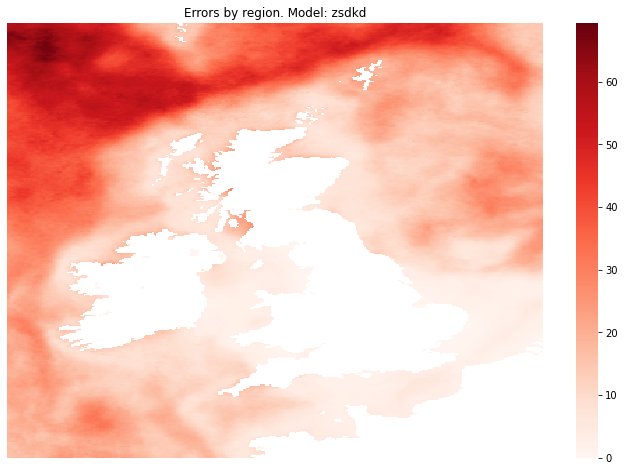

In [231]:
fig, ax = plt.subplots(figsize=(12, 8))
# Generate the heatmap on this figure
sns.heatmap(var.numpy(), cmap='Reds', ax=ax)

# Remove x and y coordinates grid
ax.grid(False)
ax.tick_params(left=False, bottom=False)
ax.set(xticklabels=[], yticklabels=[], title=f"Errors by region. Model: {_map}")
plt.savefig(f"{_map}_region_error.png", dpi=300, bbox_inches='tight')
plt.show()

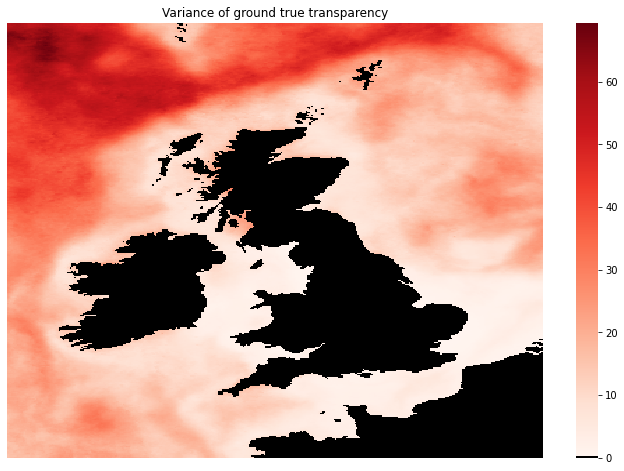

In [241]:
import matplotlib.colors as colors

var_np = var.numpy()
cmap = plt.get_cmap('Reds')
norm = colors.Normalize(vmin=var_np.min(), vmax=var_np.max())

# Set color of value 0.5 to black in colormap
colormap = cmap(np.arange(cmap.N))
colormap[np.abs(norm(0.5) - np.arange(cmap.N)).argmin(), :3] = 0.0

# Create new colormap from the above color modifications
new_cmap = colors.LinearSegmentedColormap.from_list('new_cmap', colormap)

plt.figure(figsize=(12, 8))
ax = sns.heatmap(var_np, cmap=new_cmap)
ax.set(xticklabels=[], yticklabels=[], title=f"Variance of ground true transparency")
ax.tick_params(left=False, bottom=False)
plt.savefig(f"gt_variance.png", dpi=300, bbox_inches='tight')
plt.show()

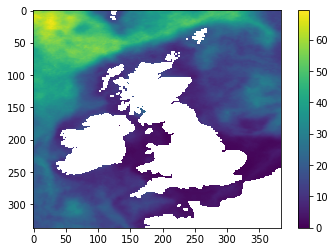

In [227]:
plt.imshow(var)
plt.colorbar()
plt.show()

In [52]:
rmse

tensor f64 0.998

In [60]:
error_region_maps

{'zsd': tensor[3, 337, 384] n=388224 x∈[0., 1.711] μ=0.397 σ=0.697 cuda:0,
 'zsd_big': tensor[3, 337, 384] n=388224 x∈[0., 1.796] μ=0.414 σ=0.728 cuda:0,
 'zsdchl': tensor[3, 337, 384] n=388224 x∈[0., 1.658] μ=0.380 σ=0.671 cuda:0,
 'zsdkd': tensor[3, 337, 384] n=388224 x∈[0., 1.675] μ=0.388 σ=0.683 cuda:0}

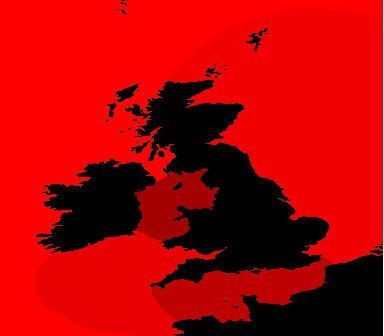

In [62]:
(((error_region_maps['zsd'] * 1.)/error_region_maps['zsd'].max())).rgb

In [95]:
error_region_maps

{'zsd': tensor[3, 337, 384] n=388224 x∈[0., 1.711] μ=0.397 σ=0.697 cuda:0,
 'zsd_big': tensor[3, 337, 384] n=388224 x∈[0., 1.796] μ=0.414 σ=0.728 cuda:0,
 'zsdchl': tensor[3, 337, 384] n=388224 x∈[0., 1.658] μ=0.380 σ=0.671 cuda:0,
 'zsdkd': tensor[3, 337, 384] n=388224 x∈[0., 1.675] μ=0.388 σ=0.683 cuda:0}

In [64]:
!pip install seaborn -q

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt

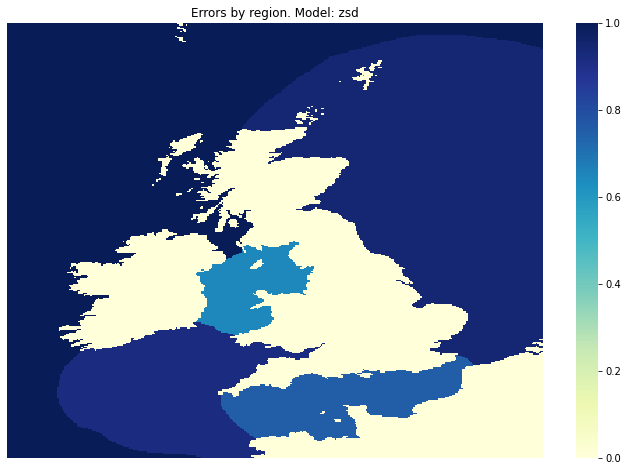

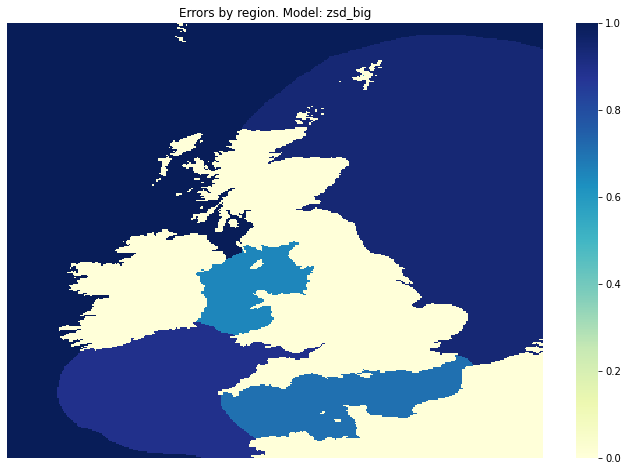

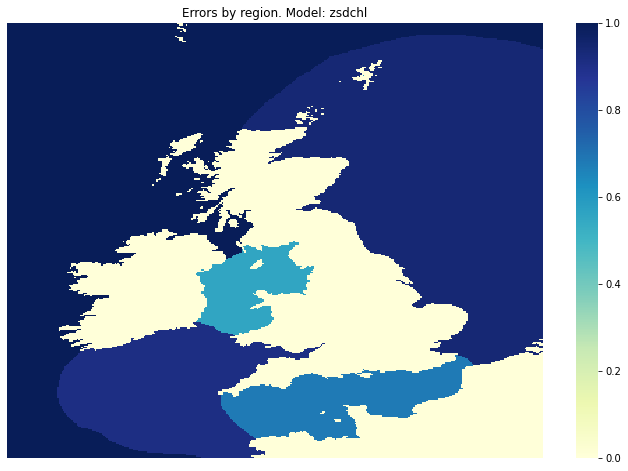

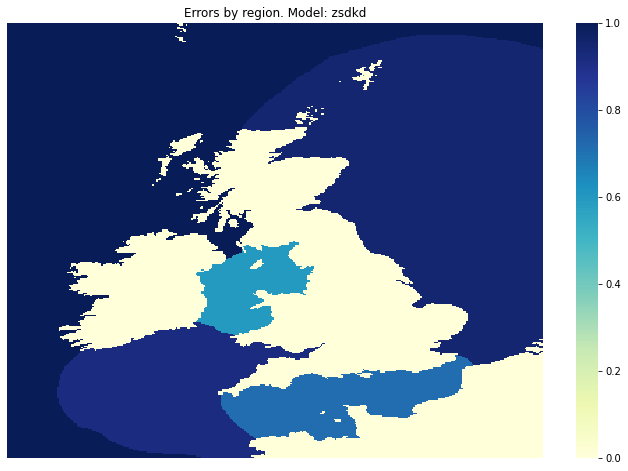

In [97]:
for _map in error_region_maps.keys():
    data = (((error_region_maps[_map] * 1.)/error_region_maps[_map].max()))[0].cpu().numpy()

    fig, ax = plt.subplots(figsize=(12, 8))

    # Generate the heatmap on this figure
    sns.heatmap(data, cmap='YlGnBu', ax=ax)

    # Remove x and y coordinates grid
    ax.grid(False)
    ax.tick_params(left=False, bottom=False)
    ax.set(xticklabels=[], yticklabels=[], title=f"Errors by region. Model: {_map}")
    plt.savefig(f"{_map}_region_error.png", dpi=300, bbox_inches='tight')
    plt.show()

In [119]:
old_mask = y[-1][None].repeat(3,1,1)
old_mask = torch.nan_to_num(old_mask, nan=0)
old_mask

tensor[3, 337, 384] n=388224 x∈[0., 34.069] μ=11.425 σ=8.934

In [120]:
old_mask = ((old_mask > 0)*255.).to(torch.uint8).permute(1,2,0)
old_mask

tensor[337, 384, 3] u8 n=388224 x∈[0, 255] μ=188.671 σ=111.868

In [122]:
Image.fromarray(old_mask.numpy()).save('old_mask.png')

## Train + Test metrics calculation

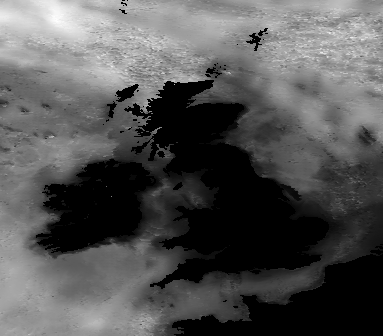

In [129]:
(y[-1][None].repeat(3,1,1) / 34.069).rgb

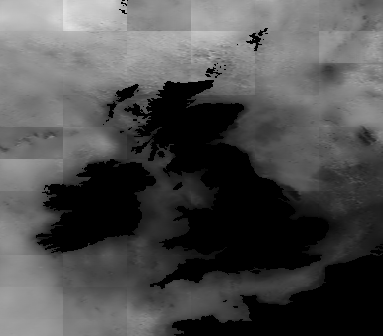

In [131]:
(x[-1][None].repeat(3,1,1) / 36.022).rgb

In [ ]:
36.022

## Baselines metrics

In [71]:
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error
from math import sqrt

In [72]:
def get_non_nan_periods(data, n_periods, period_length):
    non_nan_periods = []
    for _ in range(n_periods):
        while True:
            i, j = np.random.randint(0, data.shape[1]), np.random.randint(0, data.shape[2])
            random_start = np.random.randint(period_length, data.shape[0] - period_length)
            period = data[:random_start + period_length, i, j]
            if not np.isnan(period).any():
                non_nan_periods.append((random_start, i, j))
                break
    return non_nan_periods

In [73]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA 
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
import time

def SeS_forecast(history):
    start_time = time.time()
    model = SimpleExpSmoothing(history)
    model_fit = model.fit()
    
    yhat = model_fit.predict(len(history), len(history))
    elapsed_time = time.time() - start_time
    print(f"SeS forecast took {elapsed_time} seconds to run.")
    return yhat

def arima_forecast(history):
    start_time = time.time()
    model = ARIMA(history)
    # fit model
    model_fit = model.fit()
    # make one step forecast
    yhat = model_fit.predict(len(history), len(history))
    elapsed_time = time.time() - start_time
    print(f"Arima forecast took {elapsed_time} seconds to run.")
    return yhat[0]

In [74]:
subset = val_data

In [75]:
subset

<xarray.Dataset>
Dimensions:  (time: 276, lat: 337, lon: 384)
Coordinates:
  * time     (time) datetime64[ns] 2022-02-04 2022-02-05 ... 2022-11-06
  * lat      (lat) float32 62.02 61.98 61.94 61.9 ... 48.15 48.1 48.06 48.02
  * lon      (lon) float32 -11.98 -11.94 -11.9 -11.85 ... 3.896 3.938 3.979
Data variables:
    ZSD      (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
    CHL      (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
    KD490    (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
Attributes: (12/92)
    lon_step:                        0.041666668
    keywords:                        EARTH SCIENCE > OCEANS > OCEAN CHEMISTRY...
    cmems_product_id:                OCEANCOLOUR_GLO_BGC_L4_MY_009_104
    lat_step:                        0.041666668
    grid_mapping:                    Equirectangular
    title:                           cmems_obs-oc_glo_bgc-plankton_my_l4-gapf...
    ...                              ...
    westernmost_longitude:           -180.0
    geospatial_vertical_positive:    up
    date_created:                    2023-05-17T00:20:49Z
    nb_valid_bins:                   19022444
    pct_valid_bins:                  50.9646240569273
    History:                         Translated to CF-1.0 Conventions by Netc...

In [76]:
n_random_periods = 100_000  # adjust this value as needed
period_length = 11
random_periods = get_non_nan_periods(subset['ZSD'].values, n_random_periods, period_length)
# 1k == 26 minutes

In [264]:
np_data = subset['ZSD'].values#[start:start+period_length]

In [321]:
for i, period in enumerate(random_periods):
    start, lat, lon = period
    time_series = np_data[start:start+period_length, lat, lon]
    actual = time_series[-1]
    forecast_arima = arima_forecast(time_series[:-1])
    forecast_ses = SeS_forecast(time_series[:-1])
    if i == 10:
        break
    # print(results['zsd']['true'][start][:,lat,lon].item())
    # print(y[start, lat, lon].item())
    # print(actual)

Arima forecast took 0.017906665802001953 seconds to run.
SeS forecast took 0.004701137542724609 seconds to run.
Arima forecast took 0.013887882232666016 seconds to run.
SeS forecast took 0.0033342838287353516 seconds to run.
Arima forecast took 0.013025283813476562 seconds to run.
SeS forecast took 0.0032439231872558594 seconds to run.
Arima forecast took 0.012781143188476562 seconds to run.
SeS forecast took 0.0035812854766845703 seconds to run.
Arima forecast took 0.01348567008972168 seconds to run.
SeS forecast took 0.004384756088256836 seconds to run.
Arima forecast took 0.011847972869873047 seconds to run.
SeS forecast took 0.003336191177368164 seconds to run.
Arima forecast took 0.013897895812988281 seconds to run.
SeS forecast took 0.0037620067596435547 seconds to run.
Arima forecast took 0.011855602264404297 seconds to run.
SeS forecast took 0.003548860549926758 seconds to run.
Arima forecast took 0.012529373168945312 seconds to run.
SeS forecast took 0.003545999526977539 secon

In [330]:
5717 / 60

95.28333333333333

In [335]:
ses_time = 0.0035
arima_time = 0.013

day_points = mask.sum().item()
year_length = 276

arima_sec_day = arima_time*day_points
ses_sec_day = ses_time*day_points
print('arima:', arima_sec_day/60, arima_sec_day*year_length / 60, arima_sec_day*year_length / 60 / 60)
print('SeS:', ses_sec_day / 60, ses_sec_day*year_length / 60, ses_sec_day*year_length / 60 / 60)

print('Total mins:', arima_sec_day*year_length/60 + ses_sec_day*year_length/60)
print('Total hours:', arima_sec_day*year_length/60/60 + ses_sec_day*year_length/60/60)

arima: 20.715066666666665 5717.3584 95.28930666666666
SeS: 5.577133333333333 1539.2887999999998 25.65481333333333
Total mins: 7256.647199999999
Total hours: 120.94412


In [343]:
arima_sec_day, ses_sec_day

(1242.904, 334.628)

In [324]:
val_data

<xarray.Dataset>
Dimensions:  (time: 276, lat: 337, lon: 384)
Coordinates:
  * time     (time) datetime64[ns] 2022-02-04 2022-02-05 ... 2022-11-06
  * lat      (lat) float32 62.02 61.98 61.94 61.9 ... 48.15 48.1 48.06 48.02
  * lon      (lon) float32 -11.98 -11.94 -11.9 -11.85 ... 3.896 3.938 3.979
Data variables:
    ZSD      (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
    CHL      (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
    KD490    (time, lat, lon) float32 dask.array<chunksize=(276, 337, 384), meta=np.ndarray>
Attributes: (12/92)
    lon_step:                        0.041666668
    keywords:                        EARTH SCIENCE > OCEANS > OCEAN CHEMISTRY...
    cmems_product_id:                OCEANCOLOUR_GLO_BGC_L4_MY_009_104
    lat_step:                        0.041666668
    grid_mapping:                    Equirectangular
    title:                           cmems_obs-oc_glo_bgc-plankton_my_l4-gapf...
    ...                              ...
    westernmost_longitude:           -180.0
    geospatial_vertical_positive:    up
    date_created:                    2023-05-17T00:20:49Z
    nb_valid_bins:                   19022444
    pct_valid_bins:                  50.9646240569273
    History:                         Translated to CF-1.0 Conventions by Netc...

In [79]:
np_data = subset['ZSD'].values

In [290]:
print(f'arima: {np.array(rmse_arima).mean()}')
print(f'ses: {np.array(rmse_ses).mean()}')
print(f'zsd: {np.array(rmse_zsd).mean()}')
print(f'zsd-L: {np.array(rmse_zsd_L).mean()}')
print(f'zsdchl: {np.array(rmse_zsdchl).mean()}')
print(f'zsdkd: {np.array(rmse_zsdkd).mean()}')

arima: 0.9046054569932327
ses: 0.9046104665231214
zsd: 1.6169389018031952
zsd-L: 1.6790850090818654
zsdchl: 1.5431588873137096
zsdkd: 1.5859353526140392


In [300]:
float(np.array(rmse_zsdkd).mean())

1.59843791089952

In [303]:
import json

dick = {
'arima': float(np.array(rmse_arima).mean()),
'ses': float(np.array(rmse_ses).mean()), 
'zsd': float(np.array(rmse_zsd).mean()),
'zsd-L': float(np.array(rmse_zsd_L).mean()),
'zsdchl': float(np.array(rmse_zsdchl).mean()),
'zsdkd': float(np.array(rmse_zsdkd).mean())
}

with open('baseline_metrics.json', 'w') as f:
    json.dump(dick, f)

In [80]:
mse_list = []
mse_zsd = []
mse_zsd_L = []
mse_zsdchl = []
mse_zsdkd = []
mse_arima = []
mse_ses = []
for i, period in enumerate(tqdm(random_periods)):
    start, lat, lon = period
    time_series = np_data[start:start+period_length, lat, lon]
    actual = time_series[-1]
    # print(actual, results['zsd']['pred'][start][:,lat,lon].item(), results['zsd']['true'][start][:,lat,lon].item())
    # continue
    forecast_arima = arima_forecast(time_series[:-1])
    forecast_ses = SeS_forecast(time_series[:-1])
    mse_arima.append((mean_squared_error([actual], [forecast_arima])))
    mse_ses.append((mean_squared_error([actual], [forecast_ses])))
    mse_zsd.append((mean_squared_error([actual], [results['zsd']['pred'][start][:,lat,lon].item()])))
    mse_zsd_L.append((mean_squared_error([actual], [results['zsd_big']['pred'][start][:,lat,lon].item()])))
    mse_zsdchl.append((mean_squared_error([actual], [results['zsdchl']['pred'][start][:,lat,lon].item()])))
    mse_zsdkd.append((mean_squared_error([actual], [results['zsdkd']['pred'][start][:,lat,lon].item()])))
# dick = {
# 'arima': float(np.array(rmse_arima).mean()),
# 'ses': float(np.array(rmse_ses).mean()), 
# 'zsd': float(np.array(rmse_zsd).mean()),
# 'zsd-L': float(np.array(rmse_zsd_L).mean()),
# 'zsdchl': float(np.array(rmse_zsdchl).mean()),
# 'zsdkd': float(np.array(rmse_zsdkd).mean())
# }
# with open('baseline_metrics.json', 'w') as f:
#     json.dump(dick, f)

  0%|          | 0/100000 [00:00<?, ?it/s]

Arima forecast took 0.21157193183898926 seconds to run.
SeS forecast took 0.01357889175415039 seconds to run.
Arima forecast took 0.015976905822753906 seconds to run.
SeS forecast took 0.003519773483276367 seconds to run.
Arima forecast took 0.013314962387084961 seconds to run.
SeS forecast took 0.003458738327026367 seconds to run.
Arima forecast took 0.014069795608520508 seconds to run.
SeS forecast took 0.002814769744873047 seconds to run.
Arima forecast took 0.011330127716064453 seconds to run.
SeS forecast took 0.0035293102264404297 seconds to run.
Arima forecast took 0.012212991714477539 seconds to run.
SeS forecast took 0.003132343292236328 seconds to run.
Arima forecast took 0.013053417205810547 seconds to run.
SeS forecast took 0.003668546676635742 seconds to run.
Arima forecast took 0.01192474365234375 seconds to run.
SeS forecast took 0.003370046615600586 seconds to run.
Arima forecast took 0.013772249221801758 seconds to run.
SeS forecast took 0.003005504608154297 seconds to

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01577901840209961 seconds to run.
SeS forecast took 0.0046367645263671875 seconds to run.
Arima forecast took 0.011838436126708984 seconds to run.
SeS forecast took 0.003786802291870117 seconds to run.
Arima forecast took 0.015308618545532227 seconds to run.
SeS forecast took 0.0039021968841552734 seconds to run.
Arima forecast took 0.021736621856689453 seconds to run.
SeS forecast took 0.003742694854736328 seconds to run.
Arima forecast took 0.013538599014282227 seconds to run.
SeS forecast took 0.003376483917236328 seconds to run.
Arima forecast took 0.015205621719360352 seconds to run.
SeS forecast took 0.0038526058197021484 seconds to run.
Arima forecast took 0.01419210433959961 seconds to run.
SeS forecast took 0.0033414363861083984 seconds to run.
Arima forecast took 0.011771202087402344 seconds to run.
SeS forecast took 0.004026174545288086 seconds to run.
Arima forecast took 0.01393437385559082 seconds to run.
SeS forecast took 0.003619670867919922 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.02013683319091797 seconds to run.
SeS forecast took 0.0038084983825683594 seconds to run.
Arima forecast took 0.013640165328979492 seconds to run.
SeS forecast took 0.003531932830810547 seconds to run.
Arima forecast took 0.014254570007324219 seconds to run.
SeS forecast took 0.003125429153442383 seconds to run.
Arima forecast took 0.011594772338867188 seconds to run.
SeS forecast took 0.0036971569061279297 seconds to run.
Arima forecast took 0.011472463607788086 seconds to run.
SeS forecast took 0.003180980682373047 seconds to run.
Arima forecast took 0.012242794036865234 seconds to run.
SeS forecast took 0.003098011016845703 seconds to run.
Arima forecast took 0.012114286422729492 seconds to run.
SeS forecast took 0.003699779510498047 seconds to run.
Arima forecast took 0.01648712158203125 seconds to run.
SeS forecast took 0.003549814224243164 seconds to run.
Arima forecast took 0.011960268020629883 seconds to run.
SeS forecast took 0.003545999526977539 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.034157752990722656 seconds to run.
SeS forecast took 0.0040912628173828125 seconds to run.
Arima forecast took 0.011489391326904297 seconds to run.
SeS forecast took 0.0032358169555664062 seconds to run.
Arima forecast took 0.011221885681152344 seconds to run.
SeS forecast took 0.003306150436401367 seconds to run.
Arima forecast took 0.013187885284423828 seconds to run.
SeS forecast took 0.0030634403228759766 seconds to run.
Arima forecast took 0.010843038558959961 seconds to run.
SeS forecast took 0.003047466278076172 seconds to run.
Arima forecast took 0.013957500457763672 seconds to run.
SeS forecast took 0.0030236244201660156 seconds to run.
Arima forecast took 0.015195131301879883 seconds to run.
SeS forecast took 0.003293752670288086 seconds to run.
Arima forecast took 0.01383209228515625 seconds to run.
SeS forecast took 0.0033054351806640625 seconds to run.
Arima forecast took 0.00894927978515625 seconds to run.
SeS forecast took 0.003536701202392578 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014421463012695312 seconds to run.
SeS forecast took 0.0043087005615234375 seconds to run.
Arima forecast took 0.011955738067626953 seconds to run.
SeS forecast took 0.003700733184814453 seconds to run.
Arima forecast took 0.013052940368652344 seconds to run.
SeS forecast took 0.0038869380950927734 seconds to run.
Arima forecast took 0.012342214584350586 seconds to run.
SeS forecast took 0.0031270980834960938 seconds to run.
Arima forecast took 0.014167308807373047 seconds to run.
SeS forecast took 0.00356292724609375 seconds to run.
Arima forecast took 0.01145625114440918 seconds to run.
SeS forecast took 0.0032863616943359375 seconds to run.
Arima forecast took 0.014709949493408203 seconds to run.
SeS forecast took 0.003145933151245117 seconds to run.
Arima forecast took 0.014765024185180664 seconds to run.
SeS forecast took 0.003624439239501953 seconds to run.
Arima forecast took 0.011939525604248047 seconds to run.
SeS forecast took 0.0031616687774658203 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013661384582519531 seconds to run.
SeS forecast took 0.0037457942962646484 seconds to run.
Arima forecast took 0.009747028350830078 seconds to run.
SeS forecast took 0.003432035446166992 seconds to run.
Arima forecast took 0.013220787048339844 seconds to run.
SeS forecast took 0.0036096572875976562 seconds to run.
Arima forecast took 0.013602495193481445 seconds to run.
SeS forecast took 0.003088235855102539 seconds to run.
Arima forecast took 0.015354633331298828 seconds to run.
SeS forecast took 0.003802776336669922 seconds to run.
Arima forecast took 0.01387786865234375 seconds to run.
SeS forecast took 0.0036444664001464844 seconds to run.
Arima forecast took 0.01277303695678711 seconds to run.
SeS forecast took 0.004187822341918945 seconds to run.
Arima forecast took 0.01223301887512207 seconds to run.
SeS forecast took 0.0038025379180908203 seconds to run.
Arima forecast took 0.012570619583129883 seconds to run.
SeS forecast took 0.0036706924438476562 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014811515808105469 seconds to run.
SeS forecast took 0.003793954849243164 seconds to run.
Arima forecast took 0.012230396270751953 seconds to run.
SeS forecast took 0.0037081241607666016 seconds to run.
Arima forecast took 0.015674829483032227 seconds to run.
SeS forecast took 0.004946231842041016 seconds to run.
Arima forecast took 0.012364625930786133 seconds to run.
SeS forecast took 0.003779172897338867 seconds to run.
Arima forecast took 0.01290273666381836 seconds to run.
SeS forecast took 0.004510402679443359 seconds to run.
Arima forecast took 0.014428377151489258 seconds to run.
SeS forecast took 0.0033156871795654297 seconds to run.
Arima forecast took 0.011820554733276367 seconds to run.
SeS forecast took 0.0035400390625 seconds to run.
Arima forecast took 0.014020442962646484 seconds to run.
SeS forecast took 0.003700733184814453 seconds to run.
Arima forecast took 0.014055013656616211 seconds to run.
SeS forecast took 0.0030951499938964844 seconds to 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.031755924224853516 seconds to run.
SeS forecast took 0.004060506820678711 seconds to run.
Arima forecast took 0.014096736907958984 seconds to run.
SeS forecast took 0.0036635398864746094 seconds to run.
Arima forecast took 0.011624813079833984 seconds to run.
SeS forecast took 0.00356292724609375 seconds to run.
Arima forecast took 0.014455795288085938 seconds to run.
SeS forecast took 0.003553152084350586 seconds to run.
Arima forecast took 0.011691808700561523 seconds to run.
SeS forecast took 0.003657102584838867 seconds to run.
Arima forecast took 0.014910221099853516 seconds to run.
SeS forecast took 0.0038754940032958984 seconds to run.
Arima forecast took 0.013083696365356445 seconds to run.
SeS forecast took 0.0038628578186035156 seconds to run.
Arima forecast took 0.014468669891357422 seconds to run.
SeS forecast took 0.003814697265625 seconds to run.
Arima forecast took 0.014294147491455078 seconds to run.
SeS forecast took 0.0034601688385009766 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.015404701232910156 seconds to run.
SeS forecast took 0.0035359859466552734 seconds to run.
Arima forecast took 0.013039588928222656 seconds to run.
SeS forecast took 0.004043102264404297 seconds to run.
Arima forecast took 0.012925386428833008 seconds to run.
SeS forecast took 0.0036695003509521484 seconds to run.
Arima forecast took 0.012850522994995117 seconds to run.
SeS forecast took 0.00407862663269043 seconds to run.
Arima forecast took 0.009930849075317383 seconds to run.
SeS forecast took 0.003108978271484375 seconds to run.
Arima forecast took 0.013537406921386719 seconds to run.
SeS forecast took 0.003659963607788086 seconds to run.
Arima forecast took 0.014231443405151367 seconds to run.
SeS forecast took 0.003493785858154297 seconds to run.
Arima forecast took 0.012959718704223633 seconds to run.
SeS forecast took 0.003548860549926758 seconds to run.
Arima forecast took 0.013897180557250977 seconds to run.
SeS forecast took 0.003359079360961914 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013977527618408203 seconds to run.
SeS forecast took 0.006040096282958984 seconds to run.
Arima forecast took 0.012702226638793945 seconds to run.
SeS forecast took 0.003656625747680664 seconds to run.
Arima forecast took 0.011890411376953125 seconds to run.
SeS forecast took 0.0037360191345214844 seconds to run.
Arima forecast took 0.015516281127929688 seconds to run.
SeS forecast took 0.004122257232666016 seconds to run.
Arima forecast took 0.013371467590332031 seconds to run.
SeS forecast took 0.003206491470336914 seconds to run.
Arima forecast took 0.012894630432128906 seconds to run.
SeS forecast took 0.0035352706909179688 seconds to run.
Arima forecast took 0.012953758239746094 seconds to run.
SeS forecast took 0.003753662109375 seconds to run.
Arima forecast took 0.010771751403808594 seconds to run.
SeS forecast took 0.003784656524658203 seconds to run.
Arima forecast took 0.014018058776855469 seconds to run.
SeS forecast took 0.003618955612182617 seconds t

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.004933834075927734 seconds to run.
Arima forecast took 0.012158870697021484 seconds to run.
SeS forecast took 0.0032265186309814453 seconds to run.
Arima forecast took 0.014121294021606445 seconds to run.
SeS forecast took 0.0036003589630126953 seconds to run.
Arima forecast took 0.01089787483215332 seconds to run.
SeS forecast took 0.0032575130462646484 seconds to run.
Arima forecast took 0.013809680938720703 seconds to run.
SeS forecast took 0.003393888473510742 seconds to run.
Arima forecast took 0.012669086456298828 seconds to run.
SeS forecast took 0.003446340560913086 seconds to run.
Arima forecast took 0.011553764343261719 seconds to run.
SeS forecast took 0.0033295154571533203 seconds to run.
Arima forecast took 0.011820554733276367 seconds to run.
SeS forecast took 0.0034279823303222656 seconds to run.
Arima forecast took 0.013709306716918945 seconds to run.
SeS forecast took 0.003297090530395508 seconds to run.
Arima forecast took 0.012079000473022461 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.012789249420166016 seconds to run.
SeS forecast took 0.004071950912475586 seconds to run.
Arima forecast took 0.010650873184204102 seconds to run.
SeS forecast took 0.003721475601196289 seconds to run.
Arima forecast took 0.01170969009399414 seconds to run.
SeS forecast took 0.0035784244537353516 seconds to run.
Arima forecast took 0.015447378158569336 seconds to run.
SeS forecast took 0.0039348602294921875 seconds to run.
Arima forecast took 0.016391754150390625 seconds to run.
SeS forecast took 0.0038394927978515625 seconds to run.
Arima forecast took 0.012510538101196289 seconds to run.
SeS forecast took 0.0033555030822753906 seconds to run.
Arima forecast took 0.012222528457641602 seconds to run.
SeS forecast took 0.003351449966430664 seconds to run.
Arima forecast took 0.01254725456237793 seconds to run.
SeS forecast took 0.003713846206665039 seconds to run.
Arima forecast took 0.011522293090820312 seconds to run.
SeS forecast took 0.0032422542572021484 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.032975196838378906 seconds to run.
SeS forecast took 0.003933429718017578 seconds to run.
Arima forecast took 0.013101577758789062 seconds to run.
SeS forecast took 0.0038084983825683594 seconds to run.
Arima forecast took 0.011636495590209961 seconds to run.
SeS forecast took 0.0038051605224609375 seconds to run.
Arima forecast took 0.012542009353637695 seconds to run.
SeS forecast took 0.0034487247467041016 seconds to run.
Arima forecast took 0.011807680130004883 seconds to run.
SeS forecast took 0.0037043094635009766 seconds to run.
Arima forecast took 0.012898445129394531 seconds to run.
SeS forecast took 0.0030646324157714844 seconds to run.
Arima forecast took 0.01287841796875 seconds to run.
SeS forecast took 0.0036323070526123047 seconds to run.
Arima forecast took 0.013971567153930664 seconds to run.
SeS forecast took 0.003527402877807617 seconds to run.
Arima forecast took 0.009045839309692383 seconds to run.
SeS forecast took 0.003299236297607422 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013158798217773438 seconds to run.
SeS forecast took 0.003813505172729492 seconds to run.
Arima forecast took 0.012505292892456055 seconds to run.
SeS forecast took 0.00413823127746582 seconds to run.
Arima forecast took 0.01336216926574707 seconds to run.
SeS forecast took 0.003926277160644531 seconds to run.
Arima forecast took 0.012164115905761719 seconds to run.
SeS forecast took 0.004019498825073242 seconds to run.
Arima forecast took 0.013959646224975586 seconds to run.
SeS forecast took 0.0036668777465820312 seconds to run.
Arima forecast took 0.012064218521118164 seconds to run.
SeS forecast took 0.004510164260864258 seconds to run.
Arima forecast took 0.016338586807250977 seconds to run.
SeS forecast took 0.003637075424194336 seconds to run.
Arima forecast took 0.012418746948242188 seconds to run.
SeS forecast took 0.003692626953125 seconds to run.
Arima forecast took 0.011275529861450195 seconds to run.
SeS forecast took 0.004831552505493164 seconds to r

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.010757684707641602 seconds to run.
SeS forecast took 0.003693103790283203 seconds to run.
Arima forecast took 0.012855052947998047 seconds to run.
SeS forecast took 0.0035614967346191406 seconds to run.
Arima forecast took 0.012907981872558594 seconds to run.
SeS forecast took 0.003069639205932617 seconds to run.
Arima forecast took 0.013412952423095703 seconds to run.
SeS forecast took 0.0034949779510498047 seconds to run.
Arima forecast took 0.012871742248535156 seconds to run.
SeS forecast took 0.003518819808959961 seconds to run.
Arima forecast took 0.015039205551147461 seconds to run.
SeS forecast took 0.0037543773651123047 seconds to run.
Arima forecast took 0.010914087295532227 seconds to run.
SeS forecast took 0.003645658493041992 seconds to run.
Arima forecast took 0.013488054275512695 seconds to run.
SeS forecast took 0.002829313278198242 seconds to run.
Arima forecast took 0.010956525802612305 seconds to run.
SeS forecast took 0.003602743148803711 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014602422714233398 seconds to run.
SeS forecast took 0.0046977996826171875 seconds to run.
Arima forecast took 0.011418581008911133 seconds to run.
SeS forecast took 0.004036664962768555 seconds to run.
Arima forecast took 0.012882232666015625 seconds to run.
SeS forecast took 0.004019260406494141 seconds to run.
Arima forecast took 0.01628589630126953 seconds to run.
SeS forecast took 0.004377126693725586 seconds to run.
Arima forecast took 0.014808416366577148 seconds to run.
SeS forecast took 0.0036497116088867188 seconds to run.
Arima forecast took 0.014254570007324219 seconds to run.
SeS forecast took 0.0041086673736572266 seconds to run.
Arima forecast took 0.01298379898071289 seconds to run.
SeS forecast took 0.003830432891845703 seconds to run.
Arima forecast took 0.015391826629638672 seconds to run.
SeS forecast took 0.0036089420318603516 seconds to run.
Arima forecast took 0.016559123992919922 seconds to run.
SeS forecast took 0.0038819313049316406 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.003673553466796875 seconds to run.
Arima forecast took 0.013587713241577148 seconds to run.
SeS forecast took 0.0034139156341552734 seconds to run.
Arima forecast took 0.016013145446777344 seconds to run.
SeS forecast took 0.003867626190185547 seconds to run.
Arima forecast took 0.00894927978515625 seconds to run.
SeS forecast took 0.0045375823974609375 seconds to run.
Arima forecast took 0.013092517852783203 seconds to run.
SeS forecast took 0.0035734176635742188 seconds to run.
Arima forecast took 0.013565540313720703 seconds to run.
SeS forecast took 0.003137826919555664 seconds to run.
Arima forecast took 0.013251543045043945 seconds to run.
SeS forecast took 0.0027844905853271484 seconds to run.
Arima forecast took 0.012896537780761719 seconds to run.
SeS forecast took 0.003354310989379883 seconds to run.
Arima forecast took 0.014425039291381836 seconds to run.
SeS forecast took 0.0034072399139404297 seconds to run.
Arima forecast took 0.009996175765991211 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.03141498565673828 seconds to run.
SeS forecast took 0.003995180130004883 seconds to run.
Arima forecast took 0.011442184448242188 seconds to run.
SeS forecast took 0.0035135746002197266 seconds to run.
Arima forecast took 0.012836694717407227 seconds to run.
SeS forecast took 0.0034503936767578125 seconds to run.
Arima forecast took 0.013210296630859375 seconds to run.
SeS forecast took 0.0034711360931396484 seconds to run.
Arima forecast took 0.01384878158569336 seconds to run.
SeS forecast took 0.0033745765686035156 seconds to run.
Arima forecast took 0.013484001159667969 seconds to run.
SeS forecast took 0.003675699234008789 seconds to run.
Arima forecast took 0.012828588485717773 seconds to run.
SeS forecast took 0.0030808448791503906 seconds to run.
Arima forecast took 0.010019302368164062 seconds to run.
SeS forecast took 0.004328489303588867 seconds to run.
Arima forecast took 0.012705326080322266 seconds to run.
SeS forecast took 0.0033545494079589844 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.015301704406738281 seconds to run.
SeS forecast took 0.004236459732055664 seconds to run.
Arima forecast took 0.01508641242980957 seconds to run.
SeS forecast took 0.003724813461303711 seconds to run.
Arima forecast took 0.011331796646118164 seconds to run.
SeS forecast took 0.0035991668701171875 seconds to run.
Arima forecast took 0.014173507690429688 seconds to run.
SeS forecast took 0.0041484832763671875 seconds to run.
Arima forecast took 0.01117849349975586 seconds to run.
SeS forecast took 0.004327297210693359 seconds to run.
Arima forecast took 0.012113332748413086 seconds to run.
SeS forecast took 0.003763437271118164 seconds to run.
Arima forecast took 0.01368093490600586 seconds to run.
SeS forecast took 0.0049479007720947266 seconds to run.
Arima forecast took 0.014219284057617188 seconds to run.
SeS forecast took 0.0040035247802734375 seconds to run.
Arima forecast took 0.013964653015136719 seconds to run.
SeS forecast took 0.0030333995819091797 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01464390754699707 seconds to run.
SeS forecast took 0.0045545101165771484 seconds to run.
Arima forecast took 0.012726068496704102 seconds to run.
SeS forecast took 0.003421306610107422 seconds to run.
Arima forecast took 0.012060165405273438 seconds to run.
SeS forecast took 0.003638029098510742 seconds to run.
Arima forecast took 0.015301942825317383 seconds to run.
SeS forecast took 0.0034332275390625 seconds to run.
Arima forecast took 0.012678384780883789 seconds to run.
SeS forecast took 0.0035991668701171875 seconds to run.
Arima forecast took 0.01283407211303711 seconds to run.
SeS forecast took 0.0034639835357666016 seconds to run.
Arima forecast took 0.013983011245727539 seconds to run.
SeS forecast took 0.004443168640136719 seconds to run.
Arima forecast took 0.013663053512573242 seconds to run.
SeS forecast took 0.0033795833587646484 seconds to run.
Arima forecast took 0.011977434158325195 seconds to run.
SeS forecast took 0.0035593509674072266 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014771223068237305 seconds to run.
SeS forecast took 0.0048291683197021484 seconds to run.
Arima forecast took 0.011029243469238281 seconds to run.
SeS forecast took 0.0038788318634033203 seconds to run.
Arima forecast took 0.014713287353515625 seconds to run.
SeS forecast took 0.004804849624633789 seconds to run.
Arima forecast took 0.014111757278442383 seconds to run.
SeS forecast took 0.00392460823059082 seconds to run.
Arima forecast took 0.013790130615234375 seconds to run.
SeS forecast took 0.004316091537475586 seconds to run.
Arima forecast took 0.015950918197631836 seconds to run.
SeS forecast took 0.0036156177520751953 seconds to run.
Arima forecast took 0.015011310577392578 seconds to run.
SeS forecast took 0.003709554672241211 seconds to run.
Arima forecast took 0.014646530151367188 seconds to run.
SeS forecast took 0.003648042678833008 seconds to run.
Arima forecast took 0.013299226760864258 seconds to run.
SeS forecast took 0.0036613941192626953 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.005073070526123047 seconds to run.
Arima forecast took 0.01336979866027832 seconds to run.
SeS forecast took 0.0039031505584716797 seconds to run.
Arima forecast took 0.013457536697387695 seconds to run.
SeS forecast took 0.0035283565521240234 seconds to run.
Arima forecast took 0.014147758483886719 seconds to run.
SeS forecast took 0.0033898353576660156 seconds to run.
Arima forecast took 0.015512704849243164 seconds to run.
SeS forecast took 0.0034089088439941406 seconds to run.
Arima forecast took 0.013046026229858398 seconds to run.
SeS forecast took 0.003952980041503906 seconds to run.
Arima forecast took 0.013553619384765625 seconds to run.
SeS forecast took 0.0033736228942871094 seconds to run.
Arima forecast took 0.01222848892211914 seconds to run.
SeS forecast took 0.003882169723510742 seconds to run.
Arima forecast took 0.012937307357788086 seconds to run.
SeS forecast took 0.004798173904418945 seconds to run.
Arima forecast took 0.010909795761108398 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013280630111694336 seconds to run.
SeS forecast took 0.0037317276000976562 seconds to run.
Arima forecast took 0.011726617813110352 seconds to run.
SeS forecast took 0.0036695003509521484 seconds to run.
Arima forecast took 0.013190984725952148 seconds to run.
SeS forecast took 0.0042383670806884766 seconds to run.
Arima forecast took 0.01251983642578125 seconds to run.
SeS forecast took 0.0035746097564697266 seconds to run.
Arima forecast took 0.0179443359375 seconds to run.
SeS forecast took 0.002813100814819336 seconds to run.
Arima forecast took 0.012524604797363281 seconds to run.
SeS forecast took 0.0035588741302490234 seconds to run.
Arima forecast took 0.013476848602294922 seconds to run.
SeS forecast took 0.0038979053497314453 seconds to run.
Arima forecast took 0.013281583786010742 seconds to run.
SeS forecast took 0.003360271453857422 seconds to run.
Arima forecast took 0.013231039047241211 seconds to run.
SeS forecast took 0.003396749496459961 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013817548751831055 seconds to run.
SeS forecast took 0.004369020462036133 seconds to run.
Arima forecast took 0.01022195816040039 seconds to run.
SeS forecast took 0.003307342529296875 seconds to run.
Arima forecast took 0.011379480361938477 seconds to run.
SeS forecast took 0.0035521984100341797 seconds to run.
Arima forecast took 0.01166677474975586 seconds to run.
SeS forecast took 0.0039713382720947266 seconds to run.
Arima forecast took 0.012628316879272461 seconds to run.
SeS forecast took 0.005995512008666992 seconds to run.
Arima forecast took 0.013290643692016602 seconds to run.
SeS forecast took 0.003460407257080078 seconds to run.
Arima forecast took 0.014505147933959961 seconds to run.
SeS forecast took 0.003643512725830078 seconds to run.
Arima forecast took 0.011710882186889648 seconds to run.
SeS forecast took 0.003919839859008789 seconds to run.
Arima forecast took 0.01117396354675293 seconds to run.
SeS forecast took 0.0041811466217041016 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.015749454498291016 seconds to run.
SeS forecast took 0.004346132278442383 seconds to run.
Arima forecast took 0.01559305191040039 seconds to run.
SeS forecast took 0.004021406173706055 seconds to run.
Arima forecast took 0.015627384185791016 seconds to run.
SeS forecast took 0.005058765411376953 seconds to run.
Arima forecast took 0.01425933837890625 seconds to run.
SeS forecast took 0.004025936126708984 seconds to run.
Arima forecast took 0.013976573944091797 seconds to run.
SeS forecast took 0.0035130977630615234 seconds to run.
Arima forecast took 0.019307851791381836 seconds to run.
SeS forecast took 0.003668546676635742 seconds to run.
Arima forecast took 0.013415098190307617 seconds to run.
SeS forecast took 0.0036530494689941406 seconds to run.
Arima forecast took 0.01096653938293457 seconds to run.
SeS forecast took 0.0037984848022460938 seconds to run.
Arima forecast took 0.013252735137939453 seconds to run.
SeS forecast took 0.0040760040283203125 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01394200325012207 seconds to run.
SeS forecast took 0.0036077499389648438 seconds to run.
Arima forecast took 0.012685775756835938 seconds to run.
SeS forecast took 0.0033960342407226562 seconds to run.
Arima forecast took 0.01336359977722168 seconds to run.
SeS forecast took 0.004157543182373047 seconds to run.
Arima forecast took 0.024388790130615234 seconds to run.
SeS forecast took 0.0043795108795166016 seconds to run.
Arima forecast took 0.010762691497802734 seconds to run.
SeS forecast took 0.0035572052001953125 seconds to run.
Arima forecast took 0.012969017028808594 seconds to run.
SeS forecast took 0.0040247440338134766 seconds to run.
Arima forecast took 0.015289545059204102 seconds to run.
SeS forecast took 0.0040476322174072266 seconds to run.
Arima forecast took 0.017339706420898438 seconds to run.
SeS forecast took 0.004205942153930664 seconds to run.
Arima forecast took 0.013655900955200195 seconds to run.
SeS forecast took 0.0039310455322265625 sec

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013283729553222656 seconds to run.
SeS forecast took 0.0042591094970703125 seconds to run.
Arima forecast took 0.013006210327148438 seconds to run.
SeS forecast took 0.004550457000732422 seconds to run.
Arima forecast took 0.014421463012695312 seconds to run.
SeS forecast took 0.004114389419555664 seconds to run.
Arima forecast took 0.014000654220581055 seconds to run.
SeS forecast took 0.003209352493286133 seconds to run.
Arima forecast took 0.01263427734375 seconds to run.
SeS forecast took 0.004384517669677734 seconds to run.
Arima forecast took 0.012963056564331055 seconds to run.
SeS forecast took 0.003334522247314453 seconds to run.
Arima forecast took 0.014678955078125 seconds to run.
SeS forecast took 0.0033881664276123047 seconds to run.
Arima forecast took 0.01428532600402832 seconds to run.
SeS forecast took 0.0037186145782470703 seconds to run.
Arima forecast took 0.013897895812988281 seconds to run.
SeS forecast took 0.0034334659576416016 seconds to r

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013161420822143555 seconds to run.
SeS forecast took 0.004658937454223633 seconds to run.
Arima forecast took 0.012904644012451172 seconds to run.
SeS forecast took 0.0031702518463134766 seconds to run.
Arima forecast took 0.013967275619506836 seconds to run.
SeS forecast took 0.0033059120178222656 seconds to run.
Arima forecast took 0.013187408447265625 seconds to run.
SeS forecast took 0.004559516906738281 seconds to run.
Arima forecast took 0.013073205947875977 seconds to run.
SeS forecast took 0.003520488739013672 seconds to run.
Arima forecast took 0.015030622482299805 seconds to run.
SeS forecast took 0.0038712024688720703 seconds to run.
Arima forecast took 0.01379251480102539 seconds to run.
SeS forecast took 0.0033016204833984375 seconds to run.
Arima forecast took 0.014555215835571289 seconds to run.
SeS forecast took 0.0035119056701660156 seconds to run.
Arima forecast took 0.011993885040283203 seconds to run.
SeS forecast took 0.003872394561767578 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.0041468143463134766 seconds to run.
Arima forecast took 0.012936592102050781 seconds to run.
SeS forecast took 0.003551483154296875 seconds to run.
Arima forecast took 0.013282299041748047 seconds to run.
SeS forecast took 0.0030503273010253906 seconds to run.
Arima forecast took 0.01300501823425293 seconds to run.
SeS forecast took 0.0033178329467773438 seconds to run.
Arima forecast took 0.012972354888916016 seconds to run.
SeS forecast took 0.0035474300384521484 seconds to run.
Arima forecast took 0.013463258743286133 seconds to run.
SeS forecast took 0.0030939579010009766 seconds to run.
Arima forecast took 0.014959335327148438 seconds to run.
SeS forecast took 0.0032501220703125 seconds to run.
Arima forecast took 0.012794971466064453 seconds to run.
SeS forecast took 0.0033273696899414062 seconds to run.
Arima forecast took 0.009998798370361328 seconds to run.
SeS forecast took 0.0033195018768310547 seconds to run.
Arima forecast took 0.013924837112426758 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.030445337295532227 seconds to run.
SeS forecast took 0.003139019012451172 seconds to run.
Arima forecast took 0.012263774871826172 seconds to run.
SeS forecast took 0.0031120777130126953 seconds to run.
Arima forecast took 0.012208938598632812 seconds to run.
SeS forecast took 0.0039055347442626953 seconds to run.
Arima forecast took 0.01300954818725586 seconds to run.
SeS forecast took 0.003545045852661133 seconds to run.
Arima forecast took 0.010454654693603516 seconds to run.
SeS forecast took 0.003535747528076172 seconds to run.
Arima forecast took 0.011556863784790039 seconds to run.
SeS forecast took 0.0033643245697021484 seconds to run.
Arima forecast took 0.011101245880126953 seconds to run.
SeS forecast took 0.003400087356567383 seconds to run.
Arima forecast took 0.01411747932434082 seconds to run.
SeS forecast took 0.003640413284301758 seconds to run.
Arima forecast took 0.013757705688476562 seconds to run.
SeS forecast took 0.0035910606384277344 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.004217386245727539 seconds to run.
Arima forecast took 0.011468887329101562 seconds to run.
SeS forecast took 0.0035376548767089844 seconds to run.
Arima forecast took 0.013695001602172852 seconds to run.
SeS forecast took 0.0038480758666992188 seconds to run.
Arima forecast took 0.013763189315795898 seconds to run.
SeS forecast took 0.003701925277709961 seconds to run.
Arima forecast took 0.0137481689453125 seconds to run.
SeS forecast took 0.003212451934814453 seconds to run.
Arima forecast took 0.01532292366027832 seconds to run.
SeS forecast took 0.003523111343383789 seconds to run.
Arima forecast took 0.01184225082397461 seconds to run.
SeS forecast took 0.0035152435302734375 seconds to run.
Arima forecast took 0.011897563934326172 seconds to run.
SeS forecast took 0.003459930419921875 seconds to run.
Arima forecast took 0.012172698974609375 seconds to run.
SeS forecast took 0.002961397171020508 seconds to run.
Arima forecast took 0.011685609817504883 seconds t

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.03613710403442383 seconds to run.
SeS forecast took 0.004477024078369141 seconds to run.
Arima forecast took 0.017106056213378906 seconds to run.
SeS forecast took 0.003813505172729492 seconds to run.
Arima forecast took 0.016018390655517578 seconds to run.
SeS forecast took 0.0034818649291992188 seconds to run.
Arima forecast took 0.013358592987060547 seconds to run.
SeS forecast took 0.004414081573486328 seconds to run.
Arima forecast took 0.01644301414489746 seconds to run.
SeS forecast took 0.003652334213256836 seconds to run.
Arima forecast took 0.015548229217529297 seconds to run.
SeS forecast took 0.003468751907348633 seconds to run.
Arima forecast took 0.012687206268310547 seconds to run.
SeS forecast took 0.004128694534301758 seconds to run.
Arima forecast took 0.012410163879394531 seconds to run.
SeS forecast took 0.0037953853607177734 seconds to run.
Arima forecast took 0.011933565139770508 seconds to run.
SeS forecast took 0.0038499832153320312 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.004610776901245117 seconds to run.
Arima forecast took 0.019283056259155273 seconds to run.
SeS forecast took 0.0037848949432373047 seconds to run.
Arima forecast took 0.014652490615844727 seconds to run.
SeS forecast took 0.0029096603393554688 seconds to run.
Arima forecast took 0.011483430862426758 seconds to run.
SeS forecast took 0.0028727054595947266 seconds to run.
Arima forecast took 0.010544538497924805 seconds to run.
SeS forecast took 0.003285646438598633 seconds to run.
Arima forecast took 0.014168024063110352 seconds to run.
SeS forecast took 0.0036449432373046875 seconds to run.
Arima forecast took 0.013535737991333008 seconds to run.
SeS forecast took 0.0033528804779052734 seconds to run.
Arima forecast took 0.014099836349487305 seconds to run.
SeS forecast took 0.0034339427947998047 seconds to run.
Arima forecast took 0.014935731887817383 seconds to run.
SeS forecast took 0.003128528594970703 seconds to run.
Arima forecast took 0.012522697448730469 se

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013470888137817383 seconds to run.
SeS forecast took 0.004270076751708984 seconds to run.
Arima forecast took 0.01485586166381836 seconds to run.
SeS forecast took 0.0033926963806152344 seconds to run.
Arima forecast took 0.013208627700805664 seconds to run.
SeS forecast took 0.0042455196380615234 seconds to run.
Arima forecast took 0.014793634414672852 seconds to run.
SeS forecast took 0.0031774044036865234 seconds to run.
Arima forecast took 0.010847330093383789 seconds to run.
SeS forecast took 0.003623485565185547 seconds to run.
Arima forecast took 0.013889312744140625 seconds to run.
SeS forecast took 0.004008054733276367 seconds to run.
Arima forecast took 0.013360738754272461 seconds to run.
SeS forecast took 0.004363536834716797 seconds to run.
Arima forecast took 0.016178607940673828 seconds to run.
SeS forecast took 0.0038793087005615234 seconds to run.
Arima forecast took 0.013906002044677734 seconds to run.
SeS forecast took 0.0034132003784179688 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013717889785766602 seconds to run.
SeS forecast took 0.0037436485290527344 seconds to run.
Arima forecast took 0.013528108596801758 seconds to run.
SeS forecast took 0.0031735897064208984 seconds to run.
Arima forecast took 0.012449264526367188 seconds to run.
SeS forecast took 0.0034427642822265625 seconds to run.
Arima forecast took 0.013329505920410156 seconds to run.
SeS forecast took 0.003214120864868164 seconds to run.
Arima forecast took 0.011104345321655273 seconds to run.
SeS forecast took 0.003981590270996094 seconds to run.
Arima forecast took 0.014109611511230469 seconds to run.
SeS forecast took 0.0037457942962646484 seconds to run.
Arima forecast took 0.014990568161010742 seconds to run.
SeS forecast took 0.00467228889465332 seconds to run.
Arima forecast took 0.014098644256591797 seconds to run.
SeS forecast took 0.0035164356231689453 seconds to run.
Arima forecast took 0.015883684158325195 seconds to run.
SeS forecast took 0.0031588077545166016 sec

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014198064804077148 seconds to run.
SeS forecast took 0.00437164306640625 seconds to run.
Arima forecast took 0.013003826141357422 seconds to run.
SeS forecast took 0.003985881805419922 seconds to run.
Arima forecast took 0.013770580291748047 seconds to run.
SeS forecast took 0.0038764476776123047 seconds to run.
Arima forecast took 0.014853715896606445 seconds to run.
SeS forecast took 0.0036840438842773438 seconds to run.
Arima forecast took 0.0157318115234375 seconds to run.
SeS forecast took 0.003957033157348633 seconds to run.
Arima forecast took 0.013580322265625 seconds to run.
SeS forecast took 0.004445075988769531 seconds to run.
Arima forecast took 0.017012596130371094 seconds to run.
SeS forecast took 0.0036771297454833984 seconds to run.
Arima forecast took 0.011610269546508789 seconds to run.
SeS forecast took 0.003782033920288086 seconds to run.
Arima forecast took 0.012952327728271484 seconds to run.
SeS forecast took 0.003479480743408203 seconds to 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.03322458267211914 seconds to run.
SeS forecast took 0.00433349609375 seconds to run.
Arima forecast took 0.015496015548706055 seconds to run.
SeS forecast took 0.004538059234619141 seconds to run.
Arima forecast took 0.011881113052368164 seconds to run.
SeS forecast took 0.0041654109954833984 seconds to run.
Arima forecast took 0.012735843658447266 seconds to run.
SeS forecast took 0.003917217254638672 seconds to run.
Arima forecast took 0.01836562156677246 seconds to run.
SeS forecast took 0.003926753997802734 seconds to run.
Arima forecast took 0.013123512268066406 seconds to run.
SeS forecast took 0.0036573410034179688 seconds to run.
Arima forecast took 0.013238191604614258 seconds to run.
SeS forecast took 0.0039517879486083984 seconds to run.
Arima forecast took 0.015312910079956055 seconds to run.
SeS forecast took 0.0036695003509521484 seconds to run.
Arima forecast took 0.012191057205200195 seconds to run.
SeS forecast took 0.004057168960571289 seconds to

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013916969299316406 seconds to run.
SeS forecast took 0.004186391830444336 seconds to run.
Arima forecast took 0.010016441345214844 seconds to run.
SeS forecast took 0.004623889923095703 seconds to run.
Arima forecast took 0.012197017669677734 seconds to run.
SeS forecast took 0.0037832260131835938 seconds to run.
Arima forecast took 0.012328624725341797 seconds to run.
SeS forecast took 0.003131866455078125 seconds to run.
Arima forecast took 0.019847869873046875 seconds to run.
SeS forecast took 0.0031752586364746094 seconds to run.
Arima forecast took 0.011929035186767578 seconds to run.
SeS forecast took 0.0036933422088623047 seconds to run.
Arima forecast took 0.013486862182617188 seconds to run.
SeS forecast took 0.0036802291870117188 seconds to run.
Arima forecast took 0.01211404800415039 seconds to run.
SeS forecast took 0.003346681594848633 seconds to run.
Arima forecast took 0.013021707534790039 seconds to run.
SeS forecast took 0.0030667781829833984 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014086008071899414 seconds to run.
SeS forecast took 0.004492282867431641 seconds to run.
Arima forecast took 0.011848211288452148 seconds to run.
SeS forecast took 0.004727840423583984 seconds to run.
Arima forecast took 0.011247873306274414 seconds to run.
SeS forecast took 0.004256248474121094 seconds to run.
Arima forecast took 0.013079166412353516 seconds to run.
SeS forecast took 0.0038237571716308594 seconds to run.
Arima forecast took 0.01373434066772461 seconds to run.
SeS forecast took 0.003521442413330078 seconds to run.
Arima forecast took 0.013043403625488281 seconds to run.
SeS forecast took 0.0037431716918945312 seconds to run.
Arima forecast took 0.012031316757202148 seconds to run.
SeS forecast took 0.003414154052734375 seconds to run.
Arima forecast took 0.012204408645629883 seconds to run.
SeS forecast took 0.003843069076538086 seconds to run.
Arima forecast took 0.014163017272949219 seconds to run.
SeS forecast took 0.003730297088623047 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.004202365875244141 seconds to run.
Arima forecast took 0.013524055480957031 seconds to run.
SeS forecast took 0.0033190250396728516 seconds to run.
Arima forecast took 0.016136884689331055 seconds to run.
SeS forecast took 0.00400996208190918 seconds to run.
Arima forecast took 0.012704133987426758 seconds to run.
SeS forecast took 0.004529714584350586 seconds to run.
Arima forecast took 0.014542818069458008 seconds to run.
SeS forecast took 0.0046193599700927734 seconds to run.
Arima forecast took 0.010714292526245117 seconds to run.
SeS forecast took 0.0034487247467041016 seconds to run.
Arima forecast took 0.013821125030517578 seconds to run.
SeS forecast took 0.0032601356506347656 seconds to run.
Arima forecast took 0.014648199081420898 seconds to run.
SeS forecast took 0.004045248031616211 seconds to run.
Arima forecast took 0.015507936477661133 seconds to run.
SeS forecast took 0.003584146499633789 seconds to run.
Arima forecast took 0.010670900344848633 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.012145280838012695 seconds to run.
SeS forecast took 0.004052877426147461 seconds to run.
Arima forecast took 0.010930776596069336 seconds to run.
SeS forecast took 0.003733396530151367 seconds to run.
Arima forecast took 0.01296377182006836 seconds to run.
SeS forecast took 0.003840208053588867 seconds to run.
Arima forecast took 0.011794567108154297 seconds to run.
SeS forecast took 0.0044519901275634766 seconds to run.
Arima forecast took 0.012782812118530273 seconds to run.
SeS forecast took 0.0036585330963134766 seconds to run.
Arima forecast took 0.01798558235168457 seconds to run.
SeS forecast took 0.00536656379699707 seconds to run.
Arima forecast took 0.014165878295898438 seconds to run.
SeS forecast took 0.0040264129638671875 seconds to run.
Arima forecast took 0.013110876083374023 seconds to run.
SeS forecast took 0.0045201778411865234 seconds to run.
Arima forecast took 0.012434244155883789 seconds to run.
SeS forecast took 0.003485441207885742 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.011357307434082031 seconds to run.
SeS forecast took 0.0038406848907470703 seconds to run.
Arima forecast took 0.01600170135498047 seconds to run.
SeS forecast took 0.0033020973205566406 seconds to run.
Arima forecast took 0.010992765426635742 seconds to run.
SeS forecast took 0.0032672882080078125 seconds to run.
Arima forecast took 0.013226509094238281 seconds to run.
SeS forecast took 0.003451824188232422 seconds to run.
Arima forecast took 0.011200428009033203 seconds to run.
SeS forecast took 0.003979206085205078 seconds to run.
Arima forecast took 0.01430511474609375 seconds to run.
SeS forecast took 0.0032138824462890625 seconds to run.
Arima forecast took 0.01115870475769043 seconds to run.
SeS forecast took 0.0037310123443603516 seconds to run.
Arima forecast took 0.015549659729003906 seconds to run.
SeS forecast took 0.003902435302734375 seconds to run.
Arima forecast took 0.012397050857543945 seconds to run.
SeS forecast took 0.003083944320678711 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.005425691604614258 seconds to run.
Arima forecast took 0.014306306838989258 seconds to run.
SeS forecast took 0.004247903823852539 seconds to run.
Arima forecast took 0.011212587356567383 seconds to run.
SeS forecast took 0.0038514137268066406 seconds to run.
Arima forecast took 0.012432336807250977 seconds to run.
SeS forecast took 0.0040264129638671875 seconds to run.
Arima forecast took 0.01431417465209961 seconds to run.
SeS forecast took 0.0034055709838867188 seconds to run.
Arima forecast took 0.01378011703491211 seconds to run.
SeS forecast took 0.0040819644927978516 seconds to run.
Arima forecast took 0.015564918518066406 seconds to run.
SeS forecast took 0.0035631656646728516 seconds to run.
Arima forecast took 0.014478921890258789 seconds to run.
SeS forecast took 0.004362821578979492 seconds to run.
Arima forecast took 0.01611948013305664 seconds to run.
SeS forecast took 0.003397226333618164 seconds to run.
Arima forecast took 0.012983322143554688 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013139963150024414 seconds to run.
SeS forecast took 0.003833770751953125 seconds to run.
Arima forecast took 0.012745380401611328 seconds to run.
SeS forecast took 0.0032269954681396484 seconds to run.
Arima forecast took 0.013052940368652344 seconds to run.
SeS forecast took 0.0041234493255615234 seconds to run.
Arima forecast took 0.014497995376586914 seconds to run.
SeS forecast took 0.003576517105102539 seconds to run.
Arima forecast took 0.012987852096557617 seconds to run.
SeS forecast took 0.0040476322174072266 seconds to run.
Arima forecast took 0.013667106628417969 seconds to run.
SeS forecast took 0.0036296844482421875 seconds to run.
Arima forecast took 0.012877941131591797 seconds to run.
SeS forecast took 0.0035762786865234375 seconds to run.
Arima forecast took 0.012604236602783203 seconds to run.
SeS forecast took 0.003548860549926758 seconds to run.
Arima forecast took 0.013994455337524414 seconds to run.
SeS forecast took 0.0032472610473632812 se

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.016062259674072266 seconds to run.
SeS forecast took 0.0042493343353271484 seconds to run.
Arima forecast took 0.012493133544921875 seconds to run.
SeS forecast took 0.004072904586791992 seconds to run.
Arima forecast took 0.013415098190307617 seconds to run.
SeS forecast took 0.003259897232055664 seconds to run.
Arima forecast took 0.012880563735961914 seconds to run.
SeS forecast took 0.0037322044372558594 seconds to run.
Arima forecast took 0.012418270111083984 seconds to run.
SeS forecast took 0.0031490325927734375 seconds to run.
Arima forecast took 0.012887001037597656 seconds to run.
SeS forecast took 0.003297567367553711 seconds to run.
Arima forecast took 0.011567115783691406 seconds to run.
SeS forecast took 0.0033371448516845703 seconds to run.
Arima forecast took 0.01197671890258789 seconds to run.
SeS forecast took 0.0033159255981445312 seconds to run.
Arima forecast took 0.012941598892211914 seconds to run.
SeS forecast took 0.003355264663696289 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014096498489379883 seconds to run.
SeS forecast took 0.004073381423950195 seconds to run.
Arima forecast took 0.01087045669555664 seconds to run.
SeS forecast took 0.00394892692565918 seconds to run.
Arima forecast took 0.012356996536254883 seconds to run.
SeS forecast took 0.003553628921508789 seconds to run.
Arima forecast took 0.013092041015625 seconds to run.
SeS forecast took 0.0031604766845703125 seconds to run.
Arima forecast took 0.01318049430847168 seconds to run.
SeS forecast took 0.003667593002319336 seconds to run.
Arima forecast took 0.01452946662902832 seconds to run.
SeS forecast took 0.003809690475463867 seconds to run.
Arima forecast took 0.013126134872436523 seconds to run.
SeS forecast took 0.0034818649291992188 seconds to run.
Arima forecast took 0.014631509780883789 seconds to run.
SeS forecast took 0.0038437843322753906 seconds to run.
Arima forecast took 0.012314319610595703 seconds to run.
SeS forecast took 0.0031404495239257812 seconds to 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.030013084411621094 seconds to run.
SeS forecast took 0.0041773319244384766 seconds to run.
Arima forecast took 0.010939598083496094 seconds to run.
SeS forecast took 0.003454923629760742 seconds to run.
Arima forecast took 0.017035245895385742 seconds to run.
SeS forecast took 0.00480198860168457 seconds to run.
Arima forecast took 0.013350963592529297 seconds to run.
SeS forecast took 0.003789186477661133 seconds to run.
Arima forecast took 0.01036214828491211 seconds to run.
SeS forecast took 0.00508427619934082 seconds to run.
Arima forecast took 0.0158841609954834 seconds to run.
SeS forecast took 0.0035469532012939453 seconds to run.
Arima forecast took 0.012780427932739258 seconds to run.
SeS forecast took 0.0034487247467041016 seconds to run.
Arima forecast took 0.014055490493774414 seconds to run.
SeS forecast took 0.0035543441772460938 seconds to run.
Arima forecast took 0.014261007308959961 seconds to run.
SeS forecast took 0.004296064376831055 seconds t

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.004280805587768555 seconds to run.
Arima forecast took 0.011692285537719727 seconds to run.
SeS forecast took 0.004170656204223633 seconds to run.
Arima forecast took 0.013948678970336914 seconds to run.
SeS forecast took 0.0035886764526367188 seconds to run.
Arima forecast took 0.013411283493041992 seconds to run.
SeS forecast took 0.003810882568359375 seconds to run.
Arima forecast took 0.013379573822021484 seconds to run.
SeS forecast took 0.003481149673461914 seconds to run.
Arima forecast took 0.014179706573486328 seconds to run.
SeS forecast took 0.003340005874633789 seconds to run.
Arima forecast took 0.012727499008178711 seconds to run.
SeS forecast took 0.003786802291870117 seconds to run.
Arima forecast took 0.011139631271362305 seconds to run.
SeS forecast took 0.004228353500366211 seconds to run.
Arima forecast took 0.015523433685302734 seconds to run.
SeS forecast took 0.0037500858306884766 seconds to run.
Arima forecast took 0.014267683029174805 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.004042625427246094 seconds to run.
Arima forecast took 0.013672113418579102 seconds to run.
SeS forecast took 0.0028409957885742188 seconds to run.
Arima forecast took 0.011337041854858398 seconds to run.
SeS forecast took 0.003562450408935547 seconds to run.
Arima forecast took 0.013247489929199219 seconds to run.
SeS forecast took 0.003251791000366211 seconds to run.
Arima forecast took 0.013418912887573242 seconds to run.
SeS forecast took 0.0036368370056152344 seconds to run.
Arima forecast took 0.01312255859375 seconds to run.
SeS forecast took 0.0034253597259521484 seconds to run.
Arima forecast took 0.009475946426391602 seconds to run.
SeS forecast took 0.0037317276000976562 seconds to run.
Arima forecast took 0.012609720230102539 seconds to run.
SeS forecast took 0.003989458084106445 seconds to run.
Arima forecast took 0.012830257415771484 seconds to run.
SeS forecast took 0.003674745559692383 seconds to run.
Arima forecast took 0.011621475219726562 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.017096519470214844 seconds to run.
SeS forecast took 0.0036585330963134766 seconds to run.
Arima forecast took 0.012748241424560547 seconds to run.
SeS forecast took 0.0032427310943603516 seconds to run.
Arima forecast took 0.012024641036987305 seconds to run.
SeS forecast took 0.002908468246459961 seconds to run.
Arima forecast took 0.01185917854309082 seconds to run.
SeS forecast took 0.0035409927368164062 seconds to run.
Arima forecast took 0.01414036750793457 seconds to run.
SeS forecast took 0.003105640411376953 seconds to run.
Arima forecast took 0.011245489120483398 seconds to run.
SeS forecast took 0.003551006317138672 seconds to run.
Arima forecast took 0.014173507690429688 seconds to run.
SeS forecast took 0.003110647201538086 seconds to run.
Arima forecast took 0.013524770736694336 seconds to run.
SeS forecast took 0.0029649734497070312 seconds to run.
Arima forecast took 0.011628866195678711 seconds to run.
SeS forecast took 0.0038907527923583984 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013828516006469727 seconds to run.
SeS forecast took 0.0037882328033447266 seconds to run.
Arima forecast took 0.0147857666015625 seconds to run.
SeS forecast took 0.0034999847412109375 seconds to run.
Arima forecast took 0.008761882781982422 seconds to run.
SeS forecast took 0.003026247024536133 seconds to run.
Arima forecast took 0.014224767684936523 seconds to run.
SeS forecast took 0.0034520626068115234 seconds to run.
Arima forecast took 0.010556221008300781 seconds to run.
SeS forecast took 0.0032160282135009766 seconds to run.
Arima forecast took 0.011677026748657227 seconds to run.
SeS forecast took 0.0034389495849609375 seconds to run.
Arima forecast took 0.01416015625 seconds to run.
SeS forecast took 0.003195524215698242 seconds to run.
Arima forecast took 0.012024641036987305 seconds to run.
SeS forecast took 0.0033385753631591797 seconds to run.
Arima forecast took 0.011762380599975586 seconds to run.
SeS forecast took 0.0036611557006835938 seconds to

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.015095710754394531 seconds to run.
SeS forecast took 0.004035472869873047 seconds to run.
Arima forecast took 0.012664794921875 seconds to run.
SeS forecast took 0.004012346267700195 seconds to run.
Arima forecast took 0.014219522476196289 seconds to run.
SeS forecast took 0.003487110137939453 seconds to run.
Arima forecast took 0.013579368591308594 seconds to run.
SeS forecast took 0.004175901412963867 seconds to run.
Arima forecast took 0.013328313827514648 seconds to run.
SeS forecast took 0.0035288333892822266 seconds to run.
Arima forecast took 0.012801647186279297 seconds to run.
SeS forecast took 0.0030934810638427734 seconds to run.
Arima forecast took 0.014154195785522461 seconds to run.
SeS forecast took 0.0038650035858154297 seconds to run.
Arima forecast took 0.011308431625366211 seconds to run.
SeS forecast took 0.0036618709564208984 seconds to run.
Arima forecast took 0.013689756393432617 seconds to run.
SeS forecast took 0.003067493438720703 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014182090759277344 seconds to run.
SeS forecast took 0.004381895065307617 seconds to run.
Arima forecast took 0.01174783706665039 seconds to run.
SeS forecast took 0.004006385803222656 seconds to run.
Arima forecast took 0.014592409133911133 seconds to run.
SeS forecast took 0.003814697265625 seconds to run.
Arima forecast took 0.014777898788452148 seconds to run.
SeS forecast took 0.00390934944152832 seconds to run.
Arima forecast took 0.012160539627075195 seconds to run.
SeS forecast took 0.0052814483642578125 seconds to run.
Arima forecast took 0.010653018951416016 seconds to run.
SeS forecast took 0.00422215461730957 seconds to run.
Arima forecast took 0.012616395950317383 seconds to run.
SeS forecast took 0.003923654556274414 seconds to run.
Arima forecast took 0.014581918716430664 seconds to run.
SeS forecast took 0.004163026809692383 seconds to run.
Arima forecast took 0.012646913528442383 seconds to run.
SeS forecast took 0.003926277160644531 seconds to ru

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01188516616821289 seconds to run.
SeS forecast took 0.0043795108795166016 seconds to run.
Arima forecast took 0.013409852981567383 seconds to run.
SeS forecast took 0.003337860107421875 seconds to run.
Arima forecast took 0.010768890380859375 seconds to run.
SeS forecast took 0.003306865692138672 seconds to run.
Arima forecast took 0.011627197265625 seconds to run.
SeS forecast took 0.003232717514038086 seconds to run.
Arima forecast took 0.01267695426940918 seconds to run.
SeS forecast took 0.004379749298095703 seconds to run.
Arima forecast took 0.011130332946777344 seconds to run.
SeS forecast took 0.0033385753631591797 seconds to run.
Arima forecast took 0.010991334915161133 seconds to run.
SeS forecast took 0.003199338912963867 seconds to run.
Arima forecast took 0.013611078262329102 seconds to run.
SeS forecast took 0.0033655166625976562 seconds to run.
Arima forecast took 0.01480722427368164 seconds to run.
SeS forecast took 0.0037996768951416016 seconds to

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014358997344970703 seconds to run.
SeS forecast took 0.0042035579681396484 seconds to run.
Arima forecast took 0.013935327529907227 seconds to run.
SeS forecast took 0.003385305404663086 seconds to run.
Arima forecast took 0.012178897857666016 seconds to run.
SeS forecast took 0.0030515193939208984 seconds to run.
Arima forecast took 0.011148929595947266 seconds to run.
SeS forecast took 0.0037713050842285156 seconds to run.
Arima forecast took 0.012239694595336914 seconds to run.
SeS forecast took 0.0030875205993652344 seconds to run.
Arima forecast took 0.013074159622192383 seconds to run.
SeS forecast took 0.0036144256591796875 seconds to run.
Arima forecast took 0.011776924133300781 seconds to run.
SeS forecast took 0.0033807754516601562 seconds to run.
Arima forecast took 0.013831138610839844 seconds to run.
SeS forecast took 0.003282308578491211 seconds to run.
Arima forecast took 0.013953447341918945 seconds to run.
SeS forecast took 0.003536224365234375 se

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013113021850585938 seconds to run.
SeS forecast took 0.0043487548828125 seconds to run.
Arima forecast took 0.014430999755859375 seconds to run.
SeS forecast took 0.0028886795043945312 seconds to run.
Arima forecast took 0.01404261589050293 seconds to run.
SeS forecast took 0.0033402442932128906 seconds to run.
Arima forecast took 0.012011051177978516 seconds to run.
SeS forecast took 0.0035293102264404297 seconds to run.
Arima forecast took 0.012861251831054688 seconds to run.
SeS forecast took 0.0032024383544921875 seconds to run.
Arima forecast took 0.013454675674438477 seconds to run.
SeS forecast took 0.0035347938537597656 seconds to run.
Arima forecast took 0.014320850372314453 seconds to run.
SeS forecast took 0.0034058094024658203 seconds to run.
Arima forecast took 0.013786554336547852 seconds to run.
SeS forecast took 0.002883434295654297 seconds to run.
Arima forecast took 0.013267040252685547 seconds to run.
SeS forecast took 0.003308534622192383 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.0076673030853271484 seconds to run.
Arima forecast took 0.014951467514038086 seconds to run.
SeS forecast took 0.0039441585540771484 seconds to run.
Arima forecast took 0.013441801071166992 seconds to run.
SeS forecast took 0.004302024841308594 seconds to run.
Arima forecast took 0.014618158340454102 seconds to run.
SeS forecast took 0.005262136459350586 seconds to run.
Arima forecast took 0.01374673843383789 seconds to run.
SeS forecast took 0.004379987716674805 seconds to run.
Arima forecast took 0.011980772018432617 seconds to run.
SeS forecast took 0.0035250186920166016 seconds to run.
Arima forecast took 0.013513326644897461 seconds to run.
SeS forecast took 0.0032601356506347656 seconds to run.
Arima forecast took 0.012057065963745117 seconds to run.
SeS forecast took 0.004067659378051758 seconds to run.
Arima forecast took 0.012800931930541992 seconds to run.
SeS forecast took 0.003108501434326172 seconds to run.
Arima forecast took 0.030933141708374023 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.004803180694580078 seconds to run.
Arima forecast took 0.012395620346069336 seconds to run.
SeS forecast took 0.0032320022583007812 seconds to run.
Arima forecast took 0.013200044631958008 seconds to run.
SeS forecast took 0.005288124084472656 seconds to run.
Arima forecast took 0.012986183166503906 seconds to run.
SeS forecast took 0.003147602081298828 seconds to run.
Arima forecast took 0.013774394989013672 seconds to run.
SeS forecast took 0.0030879974365234375 seconds to run.
Arima forecast took 0.012391328811645508 seconds to run.
SeS forecast took 0.003384828567504883 seconds to run.
Arima forecast took 0.011140823364257812 seconds to run.
SeS forecast took 0.0031251907348632812 seconds to run.
Arima forecast took 0.013263702392578125 seconds to run.
SeS forecast took 0.004014015197753906 seconds to run.
Arima forecast took 0.010684728622436523 seconds to run.
SeS forecast took 0.00365447998046875 seconds to run.
Arima forecast took 0.012607336044311523 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.012589216232299805 seconds to run.
SeS forecast took 0.003870248794555664 seconds to run.
Arima forecast took 0.014887094497680664 seconds to run.
SeS forecast took 0.003378629684448242 seconds to run.
Arima forecast took 0.012230396270751953 seconds to run.
SeS forecast took 0.003482341766357422 seconds to run.
Arima forecast took 0.013045072555541992 seconds to run.
SeS forecast took 0.003505229949951172 seconds to run.
Arima forecast took 0.013285398483276367 seconds to run.
SeS forecast took 0.0033080577850341797 seconds to run.
Arima forecast took 0.011760950088500977 seconds to run.
SeS forecast took 0.003468036651611328 seconds to run.
Arima forecast took 0.014890670776367188 seconds to run.
SeS forecast took 0.0027997493743896484 seconds to run.
Arima forecast took 0.014358758926391602 seconds to run.
SeS forecast took 0.003114938735961914 seconds to run.
Arima forecast took 0.011600255966186523 seconds to run.
SeS forecast took 0.002971649169921875 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01439809799194336 seconds to run.
SeS forecast took 0.003529071807861328 seconds to run.
Arima forecast took 0.012311935424804688 seconds to run.
SeS forecast took 0.0038661956787109375 seconds to run.
Arima forecast took 0.012839078903198242 seconds to run.
SeS forecast took 0.004403829574584961 seconds to run.
Arima forecast took 0.012578248977661133 seconds to run.
SeS forecast took 0.003620624542236328 seconds to run.
Arima forecast took 0.013339519500732422 seconds to run.
SeS forecast took 0.0034432411193847656 seconds to run.
Arima forecast took 0.012925386428833008 seconds to run.
SeS forecast took 0.004309415817260742 seconds to run.
Arima forecast took 0.011419296264648438 seconds to run.
SeS forecast took 0.0033588409423828125 seconds to run.
Arima forecast took 0.013053655624389648 seconds to run.
SeS forecast took 0.003226757049560547 seconds to run.
Arima forecast took 0.012436151504516602 seconds to run.
SeS forecast took 0.003260374069213867 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.012144327163696289 seconds to run.
SeS forecast took 0.004187822341918945 seconds to run.
Arima forecast took 0.013065576553344727 seconds to run.
SeS forecast took 0.003354310989379883 seconds to run.
Arima forecast took 0.01322484016418457 seconds to run.
SeS forecast took 0.0033600330352783203 seconds to run.
Arima forecast took 0.01169896125793457 seconds to run.
SeS forecast took 0.003300189971923828 seconds to run.
Arima forecast took 0.011569976806640625 seconds to run.
SeS forecast took 0.0040209293365478516 seconds to run.
Arima forecast took 0.014007329940795898 seconds to run.
SeS forecast took 0.0038225650787353516 seconds to run.
Arima forecast took 0.014806747436523438 seconds to run.
SeS forecast took 0.0032324790954589844 seconds to run.
Arima forecast took 0.01103067398071289 seconds to run.
SeS forecast took 0.003963947296142578 seconds to run.
Arima forecast took 0.014584541320800781 seconds to run.
SeS forecast took 0.003317117691040039 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.03600454330444336 seconds to run.
SeS forecast took 0.005132913589477539 seconds to run.
Arima forecast took 0.013031005859375 seconds to run.
SeS forecast took 0.004258632659912109 seconds to run.
Arima forecast took 0.014081239700317383 seconds to run.
SeS forecast took 0.0036678314208984375 seconds to run.
Arima forecast took 0.015314340591430664 seconds to run.
SeS forecast took 0.0034961700439453125 seconds to run.
Arima forecast took 0.013228654861450195 seconds to run.
SeS forecast took 0.003927946090698242 seconds to run.
Arima forecast took 0.015034198760986328 seconds to run.
SeS forecast took 0.004118680953979492 seconds to run.
Arima forecast took 0.015093803405761719 seconds to run.
SeS forecast took 0.0033686161041259766 seconds to run.
Arima forecast took 0.013072729110717773 seconds to run.
SeS forecast took 0.0034990310668945312 seconds to run.
Arima forecast took 0.015193939208984375 seconds to run.
SeS forecast took 0.003591299057006836 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013140201568603516 seconds to run.
SeS forecast took 0.004324436187744141 seconds to run.
Arima forecast took 0.012894153594970703 seconds to run.
SeS forecast took 0.003648519515991211 seconds to run.
Arima forecast took 0.014522790908813477 seconds to run.
SeS forecast took 0.0037741661071777344 seconds to run.
Arima forecast took 0.015050888061523438 seconds to run.
SeS forecast took 0.0036520957946777344 seconds to run.
Arima forecast took 0.015096902847290039 seconds to run.
SeS forecast took 0.003714323043823242 seconds to run.
Arima forecast took 0.012933492660522461 seconds to run.
SeS forecast took 0.00408935546875 seconds to run.
Arima forecast took 0.014818906784057617 seconds to run.
SeS forecast took 0.004212617874145508 seconds to run.
Arima forecast took 0.013162612915039062 seconds to run.
SeS forecast took 0.004466533660888672 seconds to run.
Arima forecast took 0.015235424041748047 seconds to run.
SeS forecast took 0.003479480743408203 seconds to

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01596379280090332 seconds to run.
SeS forecast took 0.005767822265625 seconds to run.
Arima forecast took 0.01414179801940918 seconds to run.
SeS forecast took 0.004258394241333008 seconds to run.
Arima forecast took 0.016312360763549805 seconds to run.
SeS forecast took 0.0046613216400146484 seconds to run.
Arima forecast took 0.014519691467285156 seconds to run.
SeS forecast took 0.0049915313720703125 seconds to run.
Arima forecast took 0.016872644424438477 seconds to run.
SeS forecast took 0.004785060882568359 seconds to run.
Arima forecast took 0.017969846725463867 seconds to run.
SeS forecast took 0.005409955978393555 seconds to run.
Arima forecast took 0.016294002532958984 seconds to run.
SeS forecast took 0.0038709640502929688 seconds to run.
Arima forecast took 0.01674962043762207 seconds to run.
SeS forecast took 0.004099607467651367 seconds to run.
Arima forecast took 0.016337156295776367 seconds to run.
SeS forecast took 0.004204273223876953 seconds to 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.016713380813598633 seconds to run.
SeS forecast took 0.004477500915527344 seconds to run.
Arima forecast took 0.013796091079711914 seconds to run.
SeS forecast took 0.00427699089050293 seconds to run.
Arima forecast took 0.013399362564086914 seconds to run.
SeS forecast took 0.004415035247802734 seconds to run.
Arima forecast took 0.014228343963623047 seconds to run.
SeS forecast took 0.0037565231323242188 seconds to run.
Arima forecast took 0.012417793273925781 seconds to run.
SeS forecast took 0.003800630569458008 seconds to run.
Arima forecast took 0.012348651885986328 seconds to run.
SeS forecast took 0.003286600112915039 seconds to run.
Arima forecast took 0.016783475875854492 seconds to run.
SeS forecast took 0.0036754608154296875 seconds to run.
Arima forecast took 0.013183355331420898 seconds to run.
SeS forecast took 0.0035581588745117188 seconds to run.
Arima forecast took 0.012025833129882812 seconds to run.
SeS forecast took 0.0037572383880615234 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.03167080879211426 seconds to run.
SeS forecast took 0.0043795108795166016 seconds to run.
Arima forecast took 0.012171745300292969 seconds to run.
SeS forecast took 0.0032405853271484375 seconds to run.
Arima forecast took 0.010311126708984375 seconds to run.
SeS forecast took 0.003205537796020508 seconds to run.
Arima forecast took 0.012167215347290039 seconds to run.
SeS forecast took 0.002908468246459961 seconds to run.
Arima forecast took 0.01267695426940918 seconds to run.
SeS forecast took 0.003379344940185547 seconds to run.
Arima forecast took 0.011929512023925781 seconds to run.
SeS forecast took 0.002964019775390625 seconds to run.
Arima forecast took 0.01450490951538086 seconds to run.
SeS forecast took 0.0031862258911132812 seconds to run.
Arima forecast took 0.011220216751098633 seconds to run.
SeS forecast took 0.003196239471435547 seconds to run.
Arima forecast took 0.013913393020629883 seconds to run.
SeS forecast took 0.0035173892974853516 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013379812240600586 seconds to run.
SeS forecast took 0.003790140151977539 seconds to run.
Arima forecast took 0.011275529861450195 seconds to run.
SeS forecast took 0.003107309341430664 seconds to run.
Arima forecast took 0.011650323867797852 seconds to run.
SeS forecast took 0.0031142234802246094 seconds to run.
Arima forecast took 0.013846397399902344 seconds to run.
SeS forecast took 0.003185272216796875 seconds to run.
Arima forecast took 0.015457391738891602 seconds to run.
SeS forecast took 0.003788471221923828 seconds to run.
Arima forecast took 0.012183904647827148 seconds to run.
SeS forecast took 0.0036530494689941406 seconds to run.
Arima forecast took 0.013628721237182617 seconds to run.
SeS forecast took 0.005369663238525391 seconds to run.
Arima forecast took 0.009695768356323242 seconds to run.
SeS forecast took 0.003278017044067383 seconds to run.
Arima forecast took 0.012341499328613281 seconds to run.
SeS forecast took 0.0031995773315429688 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.011720895767211914 seconds to run.
SeS forecast took 0.0038738250732421875 seconds to run.
Arima forecast took 0.012025833129882812 seconds to run.
SeS forecast took 0.003081083297729492 seconds to run.
Arima forecast took 0.013657331466674805 seconds to run.
SeS forecast took 0.0035729408264160156 seconds to run.
Arima forecast took 0.012271642684936523 seconds to run.
SeS forecast took 0.003258943557739258 seconds to run.
Arima forecast took 0.011870861053466797 seconds to run.
SeS forecast took 0.0034074783325195312 seconds to run.
Arima forecast took 0.01325535774230957 seconds to run.
SeS forecast took 0.003363370895385742 seconds to run.
Arima forecast took 0.008119821548461914 seconds to run.
SeS forecast took 0.003679990768432617 seconds to run.
Arima forecast took 0.012823820114135742 seconds to run.
SeS forecast took 0.003011941909790039 seconds to run.
Arima forecast took 0.014307260513305664 seconds to run.
SeS forecast took 0.003698110580444336 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.03257465362548828 seconds to run.
SeS forecast took 0.004903316497802734 seconds to run.
Arima forecast took 0.014290809631347656 seconds to run.
SeS forecast took 0.004739046096801758 seconds to run.
Arima forecast took 0.01239633560180664 seconds to run.
SeS forecast took 0.0031898021697998047 seconds to run.
Arima forecast took 0.015254497528076172 seconds to run.
SeS forecast took 0.00395512580871582 seconds to run.
Arima forecast took 0.01365971565246582 seconds to run.
SeS forecast took 0.0038771629333496094 seconds to run.
Arima forecast took 0.012448787689208984 seconds to run.
SeS forecast took 0.004105567932128906 seconds to run.
Arima forecast took 0.011327028274536133 seconds to run.
SeS forecast took 0.0033931732177734375 seconds to run.
Arima forecast took 0.01598668098449707 seconds to run.
SeS forecast took 0.0031290054321289062 seconds to run.
Arima forecast took 0.012365341186523438 seconds to run.
SeS forecast took 0.0031549930572509766 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013060331344604492 seconds to run.
SeS forecast took 0.0037682056427001953 seconds to run.
Arima forecast took 0.013246297836303711 seconds to run.
SeS forecast took 0.0031523704528808594 seconds to run.
Arima forecast took 0.013593196868896484 seconds to run.
SeS forecast took 0.003783702850341797 seconds to run.
Arima forecast took 0.014117956161499023 seconds to run.
SeS forecast took 0.004675149917602539 seconds to run.
Arima forecast took 0.013638019561767578 seconds to run.
SeS forecast took 0.0035669803619384766 seconds to run.
Arima forecast took 0.013234376907348633 seconds to run.
SeS forecast took 0.003998279571533203 seconds to run.
Arima forecast took 0.01544189453125 seconds to run.
SeS forecast took 0.0043163299560546875 seconds to run.
Arima forecast took 0.012310981750488281 seconds to run.
SeS forecast took 0.0035507678985595703 seconds to run.
Arima forecast took 0.013458728790283203 seconds to run.
SeS forecast took 0.003776073455810547 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.0044422149658203125 seconds to run.
Arima forecast took 0.012449502944946289 seconds to run.
SeS forecast took 0.0035021305084228516 seconds to run.
Arima forecast took 0.011269807815551758 seconds to run.
SeS forecast took 0.0037882328033447266 seconds to run.
Arima forecast took 0.011284351348876953 seconds to run.
SeS forecast took 0.0036270618438720703 seconds to run.
Arima forecast took 0.011303186416625977 seconds to run.
SeS forecast took 0.0035829544067382812 seconds to run.
Arima forecast took 0.01130056381225586 seconds to run.
SeS forecast took 0.0033617019653320312 seconds to run.
Arima forecast took 0.013336420059204102 seconds to run.
SeS forecast took 0.0033135414123535156 seconds to run.
Arima forecast took 0.011879682540893555 seconds to run.
SeS forecast took 0.0030395984649658203 seconds to run.
Arima forecast took 0.013117313385009766 seconds to run.
SeS forecast took 0.0037195682525634766 seconds to run.
Arima forecast took 0.009619712829589844 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.017447710037231445 seconds to run.
SeS forecast took 0.004523277282714844 seconds to run.
Arima forecast took 0.013010978698730469 seconds to run.
SeS forecast took 0.004843711853027344 seconds to run.
Arima forecast took 0.014762163162231445 seconds to run.
SeS forecast took 0.00457453727722168 seconds to run.
Arima forecast took 0.014755725860595703 seconds to run.
SeS forecast took 0.004430294036865234 seconds to run.
Arima forecast took 0.016852378845214844 seconds to run.
SeS forecast took 0.0045185089111328125 seconds to run.
Arima forecast took 0.015270471572875977 seconds to run.
SeS forecast took 0.00476837158203125 seconds to run.
Arima forecast took 0.014768838882446289 seconds to run.
SeS forecast took 0.004072666168212891 seconds to run.
Arima forecast took 0.014235496520996094 seconds to run.
SeS forecast took 0.004094600677490234 seconds to run.
Arima forecast took 0.01518106460571289 seconds to run.
SeS forecast took 0.004781484603881836 seconds to

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.015252351760864258 seconds to run.
SeS forecast took 0.004060983657836914 seconds to run.
Arima forecast took 0.011123180389404297 seconds to run.
SeS forecast took 0.0032782554626464844 seconds to run.
Arima forecast took 0.01117563247680664 seconds to run.
SeS forecast took 0.003117084503173828 seconds to run.
Arima forecast took 0.01263284683227539 seconds to run.
SeS forecast took 0.0032727718353271484 seconds to run.
Arima forecast took 0.008918046951293945 seconds to run.
SeS forecast took 0.003645181655883789 seconds to run.
Arima forecast took 0.012717723846435547 seconds to run.
SeS forecast took 0.0034437179565429688 seconds to run.
Arima forecast took 0.014091968536376953 seconds to run.
SeS forecast took 0.0035247802734375 seconds to run.
Arima forecast took 0.011551380157470703 seconds to run.
SeS forecast took 0.003222942352294922 seconds to run.
Arima forecast took 0.020343542098999023 seconds to run.
SeS forecast took 0.003714323043823242 seconds t

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013720512390136719 seconds to run.
SeS forecast took 0.004458427429199219 seconds to run.
Arima forecast took 0.014434099197387695 seconds to run.
SeS forecast took 0.003834247589111328 seconds to run.
Arima forecast took 0.01302194595336914 seconds to run.
SeS forecast took 0.0035734176635742188 seconds to run.
Arima forecast took 0.01614856719970703 seconds to run.
SeS forecast took 0.0041656494140625 seconds to run.
Arima forecast took 0.012378454208374023 seconds to run.
SeS forecast took 0.003454923629760742 seconds to run.
Arima forecast took 0.013220787048339844 seconds to run.
SeS forecast took 0.004229307174682617 seconds to run.
Arima forecast took 0.025469303131103516 seconds to run.
SeS forecast took 0.004982471466064453 seconds to run.
Arima forecast took 0.019938230514526367 seconds to run.
SeS forecast took 0.00510096549987793 seconds to run.
Arima forecast took 0.017012596130371094 seconds to run.
SeS forecast took 0.0038328170776367188 seconds to 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014020919799804688 seconds to run.
SeS forecast took 0.004286050796508789 seconds to run.
Arima forecast took 0.011547327041625977 seconds to run.
SeS forecast took 0.0034296512603759766 seconds to run.
Arima forecast took 0.010068178176879883 seconds to run.
SeS forecast took 0.003429889678955078 seconds to run.
Arima forecast took 0.013067483901977539 seconds to run.
SeS forecast took 0.003812551498413086 seconds to run.
Arima forecast took 0.012829065322875977 seconds to run.
SeS forecast took 0.0030558109283447266 seconds to run.
Arima forecast took 0.011727333068847656 seconds to run.
SeS forecast took 0.002776622772216797 seconds to run.
Arima forecast took 0.01233530044555664 seconds to run.
SeS forecast took 0.0035369396209716797 seconds to run.
Arima forecast took 0.009462594985961914 seconds to run.
SeS forecast took 0.0034804344177246094 seconds to run.
Arima forecast took 0.013425111770629883 seconds to run.
SeS forecast took 0.0032472610473632812 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.016147851943969727 seconds to run.
SeS forecast took 0.0041425228118896484 seconds to run.
Arima forecast took 0.01276850700378418 seconds to run.
SeS forecast took 0.003972768783569336 seconds to run.
Arima forecast took 0.013590335845947266 seconds to run.
SeS forecast took 0.004309654235839844 seconds to run.
Arima forecast took 0.014886140823364258 seconds to run.
SeS forecast took 0.0037283897399902344 seconds to run.
Arima forecast took 0.014837026596069336 seconds to run.
SeS forecast took 0.003880023956298828 seconds to run.
Arima forecast took 0.016015052795410156 seconds to run.
SeS forecast took 0.0034987926483154297 seconds to run.
Arima forecast took 0.012836694717407227 seconds to run.
SeS forecast took 0.003993511199951172 seconds to run.
Arima forecast took 0.012555122375488281 seconds to run.
SeS forecast took 0.003983497619628906 seconds to run.
Arima forecast took 0.014031648635864258 seconds to run.
SeS forecast took 0.004578590393066406 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.03288722038269043 seconds to run.
SeS forecast took 0.0047147274017333984 seconds to run.
Arima forecast took 0.013573408126831055 seconds to run.
SeS forecast took 0.003489971160888672 seconds to run.
Arima forecast took 0.013220071792602539 seconds to run.
SeS forecast took 0.003941774368286133 seconds to run.
Arima forecast took 0.011787891387939453 seconds to run.
SeS forecast took 0.0037527084350585938 seconds to run.
Arima forecast took 0.01385951042175293 seconds to run.
SeS forecast took 0.003572225570678711 seconds to run.
Arima forecast took 0.012202739715576172 seconds to run.
SeS forecast took 0.003115415573120117 seconds to run.
Arima forecast took 0.011949539184570312 seconds to run.
SeS forecast took 0.0038814544677734375 seconds to run.
Arima forecast took 0.013792753219604492 seconds to run.
SeS forecast took 0.0037207603454589844 seconds to run.
Arima forecast took 0.011589765548706055 seconds to run.
SeS forecast took 0.0034677982330322266 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.0043621063232421875 seconds to run.
Arima forecast took 0.01455545425415039 seconds to run.
SeS forecast took 0.0030624866485595703 seconds to run.
Arima forecast took 0.012287139892578125 seconds to run.
SeS forecast took 0.0032196044921875 seconds to run.
Arima forecast took 0.01156306266784668 seconds to run.
SeS forecast took 0.003525972366333008 seconds to run.
Arima forecast took 0.011886835098266602 seconds to run.
SeS forecast took 0.0036313533782958984 seconds to run.
Arima forecast took 0.011214971542358398 seconds to run.
SeS forecast took 0.0030617713928222656 seconds to run.
Arima forecast took 0.011188745498657227 seconds to run.
SeS forecast took 0.0038716793060302734 seconds to run.
Arima forecast took 0.013821601867675781 seconds to run.
SeS forecast took 0.003466367721557617 seconds to run.
Arima forecast took 0.010729789733886719 seconds to run.
SeS forecast took 0.0030727386474609375 seconds to run.
Arima forecast took 0.011403083801269531 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01410365104675293 seconds to run.
SeS forecast took 0.003666400909423828 seconds to run.
Arima forecast took 0.014070510864257812 seconds to run.
SeS forecast took 0.004088640213012695 seconds to run.
Arima forecast took 0.012433290481567383 seconds to run.
SeS forecast took 0.0036399364471435547 seconds to run.
Arima forecast took 0.013850688934326172 seconds to run.
SeS forecast took 0.004780292510986328 seconds to run.
Arima forecast took 0.013091087341308594 seconds to run.
SeS forecast took 0.0034761428833007812 seconds to run.
Arima forecast took 0.015424728393554688 seconds to run.
SeS forecast took 0.0038590431213378906 seconds to run.
Arima forecast took 0.014339208602905273 seconds to run.
SeS forecast took 0.0041964054107666016 seconds to run.
Arima forecast took 0.013959407806396484 seconds to run.
SeS forecast took 0.004202604293823242 seconds to run.
Arima forecast took 0.013500690460205078 seconds to run.
SeS forecast took 0.003311634063720703 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014244556427001953 seconds to run.
SeS forecast took 0.005015373229980469 seconds to run.
Arima forecast took 0.015878915786743164 seconds to run.
SeS forecast took 0.0034530162811279297 seconds to run.
Arima forecast took 0.011840105056762695 seconds to run.
SeS forecast took 0.003824949264526367 seconds to run.
Arima forecast took 0.012537240982055664 seconds to run.
SeS forecast took 0.004315614700317383 seconds to run.
Arima forecast took 0.01140284538269043 seconds to run.
SeS forecast took 0.0039119720458984375 seconds to run.
Arima forecast took 0.010107994079589844 seconds to run.
SeS forecast took 0.0030870437622070312 seconds to run.
Arima forecast took 0.013757944107055664 seconds to run.
SeS forecast took 0.0032863616943359375 seconds to run.
Arima forecast took 0.012756824493408203 seconds to run.
SeS forecast took 0.003663301467895508 seconds to run.
Arima forecast took 0.013535737991333008 seconds to run.
SeS forecast took 0.003530263900756836 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.012989521026611328 seconds to run.
SeS forecast took 0.004768848419189453 seconds to run.
Arima forecast took 0.013802766799926758 seconds to run.
SeS forecast took 0.0035223960876464844 seconds to run.
Arima forecast took 0.01365041732788086 seconds to run.
SeS forecast took 0.0035758018493652344 seconds to run.
Arima forecast took 0.016266584396362305 seconds to run.
SeS forecast took 0.003629446029663086 seconds to run.
Arima forecast took 0.009640693664550781 seconds to run.
SeS forecast took 0.0037689208984375 seconds to run.
Arima forecast took 0.013514995574951172 seconds to run.
SeS forecast took 0.003699779510498047 seconds to run.
Arima forecast took 0.01296091079711914 seconds to run.
SeS forecast took 0.0032567977905273438 seconds to run.
Arima forecast took 0.013909101486206055 seconds to run.
SeS forecast took 0.004652738571166992 seconds to run.
Arima forecast took 0.011377811431884766 seconds to run.
SeS forecast took 0.0035033226013183594 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.015677213668823242 seconds to run.
SeS forecast took 0.003934621810913086 seconds to run.
Arima forecast took 0.01353907585144043 seconds to run.
SeS forecast took 0.004101753234863281 seconds to run.
Arima forecast took 0.014714956283569336 seconds to run.
SeS forecast took 0.004118204116821289 seconds to run.
Arima forecast took 0.013687372207641602 seconds to run.
SeS forecast took 0.003860950469970703 seconds to run.
Arima forecast took 0.01495051383972168 seconds to run.
SeS forecast took 0.0035512447357177734 seconds to run.
Arima forecast took 0.0135040283203125 seconds to run.
SeS forecast took 0.0029964447021484375 seconds to run.
Arima forecast took 0.01043391227722168 seconds to run.
SeS forecast took 0.003131389617919922 seconds to run.
Arima forecast took 0.01371002197265625 seconds to run.
SeS forecast took 0.003809690475463867 seconds to run.
Arima forecast took 0.010269403457641602 seconds to run.
SeS forecast took 0.0034677982330322266 seconds to 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014002561569213867 seconds to run.
SeS forecast took 0.0036911964416503906 seconds to run.
Arima forecast took 0.012859582901000977 seconds to run.
SeS forecast took 0.003892183303833008 seconds to run.
Arima forecast took 0.01520991325378418 seconds to run.
SeS forecast took 0.0039293766021728516 seconds to run.
Arima forecast took 0.014253377914428711 seconds to run.
SeS forecast took 0.0035276412963867188 seconds to run.
Arima forecast took 0.013210296630859375 seconds to run.
SeS forecast took 0.0035233497619628906 seconds to run.
Arima forecast took 0.011191844940185547 seconds to run.
SeS forecast took 0.004315614700317383 seconds to run.
Arima forecast took 0.013345718383789062 seconds to run.
SeS forecast took 0.0032765865325927734 seconds to run.
Arima forecast took 0.011790752410888672 seconds to run.
SeS forecast took 0.002940654754638672 seconds to run.
Arima forecast took 0.011347055435180664 seconds to run.
SeS forecast took 0.0035486221313476562 sec

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.031607866287231445 seconds to run.
SeS forecast took 0.0045244693756103516 seconds to run.
Arima forecast took 0.01198720932006836 seconds to run.
SeS forecast took 0.003078460693359375 seconds to run.
Arima forecast took 0.013599872589111328 seconds to run.
SeS forecast took 0.004458189010620117 seconds to run.
Arima forecast took 0.013807296752929688 seconds to run.
SeS forecast took 0.0034978389739990234 seconds to run.
Arima forecast took 0.011710405349731445 seconds to run.
SeS forecast took 0.003098011016845703 seconds to run.
Arima forecast took 0.012228012084960938 seconds to run.
SeS forecast took 0.003259897232055664 seconds to run.
Arima forecast took 0.011465787887573242 seconds to run.
SeS forecast took 0.0032300949096679688 seconds to run.
Arima forecast took 0.012349843978881836 seconds to run.
SeS forecast took 0.0033037662506103516 seconds to run.
Arima forecast took 0.014854192733764648 seconds to run.
SeS forecast took 0.0032210350036621094 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01638507843017578 seconds to run.
SeS forecast took 0.005913734436035156 seconds to run.
Arima forecast took 0.01579117774963379 seconds to run.
SeS forecast took 0.0032510757446289062 seconds to run.
Arima forecast took 0.012825727462768555 seconds to run.
SeS forecast took 0.0032682418823242188 seconds to run.
Arima forecast took 0.011599063873291016 seconds to run.
SeS forecast took 0.004251003265380859 seconds to run.
Arima forecast took 0.010162591934204102 seconds to run.
SeS forecast took 0.0035102367401123047 seconds to run.
Arima forecast took 0.014875411987304688 seconds to run.
SeS forecast took 0.0029566287994384766 seconds to run.
Arima forecast took 0.01319575309753418 seconds to run.
SeS forecast took 0.0035047531127929688 seconds to run.
Arima forecast took 0.015243053436279297 seconds to run.
SeS forecast took 0.0031578540802001953 seconds to run.
Arima forecast took 0.012839555740356445 seconds to run.
SeS forecast took 0.003197193145751953 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.018473148345947266 seconds to run.
SeS forecast took 0.004999399185180664 seconds to run.
Arima forecast took 0.014398813247680664 seconds to run.
SeS forecast took 0.0034780502319335938 seconds to run.
Arima forecast took 0.013566017150878906 seconds to run.
SeS forecast took 0.0031898021697998047 seconds to run.
Arima forecast took 0.012154340744018555 seconds to run.
SeS forecast took 0.0033500194549560547 seconds to run.
Arima forecast took 0.011858701705932617 seconds to run.
SeS forecast took 0.0032041072845458984 seconds to run.
Arima forecast took 0.012985706329345703 seconds to run.
SeS forecast took 0.0035016536712646484 seconds to run.
Arima forecast took 0.01347494125366211 seconds to run.
SeS forecast took 0.005335330963134766 seconds to run.
Arima forecast took 0.010930299758911133 seconds to run.
SeS forecast took 0.004381656646728516 seconds to run.
Arima forecast took 0.014643192291259766 seconds to run.
SeS forecast took 0.003735780715942383 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.015146732330322266 seconds to run.
SeS forecast took 0.0057926177978515625 seconds to run.
Arima forecast took 0.01417684555053711 seconds to run.
SeS forecast took 0.00410008430480957 seconds to run.
Arima forecast took 0.012679815292358398 seconds to run.
SeS forecast took 0.003541231155395508 seconds to run.
Arima forecast took 0.014882326126098633 seconds to run.
SeS forecast took 0.0037145614624023438 seconds to run.
Arima forecast took 0.013683319091796875 seconds to run.
SeS forecast took 0.0033469200134277344 seconds to run.
Arima forecast took 0.014322996139526367 seconds to run.
SeS forecast took 0.003712892532348633 seconds to run.
Arima forecast took 0.01593923568725586 seconds to run.
SeS forecast took 0.0037996768951416016 seconds to run.
Arima forecast took 0.015596389770507812 seconds to run.
SeS forecast took 0.003560304641723633 seconds to run.
Arima forecast took 0.014014959335327148 seconds to run.
SeS forecast took 0.0034830570220947266 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01231241226196289 seconds to run.
SeS forecast took 0.004549503326416016 seconds to run.
Arima forecast took 0.010721206665039062 seconds to run.
SeS forecast took 0.0032186508178710938 seconds to run.
Arima forecast took 0.012920856475830078 seconds to run.
SeS forecast took 0.0028760433197021484 seconds to run.
Arima forecast took 0.012765645980834961 seconds to run.
SeS forecast took 0.0038611888885498047 seconds to run.
Arima forecast took 0.013469934463500977 seconds to run.
SeS forecast took 0.003071308135986328 seconds to run.
Arima forecast took 0.01349020004272461 seconds to run.
SeS forecast took 0.0033447742462158203 seconds to run.
Arima forecast took 0.014127969741821289 seconds to run.
SeS forecast took 0.0035407543182373047 seconds to run.
Arima forecast took 0.01929306983947754 seconds to run.
SeS forecast took 0.004331111907958984 seconds to run.
Arima forecast took 0.011738061904907227 seconds to run.
SeS forecast took 0.003765583038330078 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014397382736206055 seconds to run.
SeS forecast took 0.004231452941894531 seconds to run.
Arima forecast took 0.013236522674560547 seconds to run.
SeS forecast took 0.004011631011962891 seconds to run.
Arima forecast took 0.01199960708618164 seconds to run.
SeS forecast took 0.0038144588470458984 seconds to run.
Arima forecast took 0.013054609298706055 seconds to run.
SeS forecast took 0.0037572383880615234 seconds to run.
Arima forecast took 0.013553142547607422 seconds to run.
SeS forecast took 0.003616809844970703 seconds to run.
Arima forecast took 0.010982036590576172 seconds to run.
SeS forecast took 0.0033004283905029297 seconds to run.
Arima forecast took 0.011951446533203125 seconds to run.
SeS forecast took 0.003830432891845703 seconds to run.
Arima forecast took 0.012627363204956055 seconds to run.
SeS forecast took 0.0042552947998046875 seconds to run.
Arima forecast took 0.012516498565673828 seconds to run.
SeS forecast took 0.0034863948822021484 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01340174674987793 seconds to run.
SeS forecast took 0.00393366813659668 seconds to run.
Arima forecast took 0.011394262313842773 seconds to run.
SeS forecast took 0.003163576126098633 seconds to run.
Arima forecast took 0.012146472930908203 seconds to run.
SeS forecast took 0.003244161605834961 seconds to run.
Arima forecast took 0.011975526809692383 seconds to run.
SeS forecast took 0.0032150745391845703 seconds to run.
Arima forecast took 0.012998819351196289 seconds to run.
SeS forecast took 0.0033173561096191406 seconds to run.
Arima forecast took 0.01614665985107422 seconds to run.
SeS forecast took 0.003466367721557617 seconds to run.
Arima forecast took 0.013410806655883789 seconds to run.
SeS forecast took 0.003246307373046875 seconds to run.
Arima forecast took 0.022580385208129883 seconds to run.
SeS forecast took 0.003523111343383789 seconds to run.
Arima forecast took 0.010107040405273438 seconds to run.
SeS forecast took 0.003805398941040039 seconds t

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.03488945960998535 seconds to run.
SeS forecast took 0.003877878189086914 seconds to run.
Arima forecast took 0.013921499252319336 seconds to run.
SeS forecast took 0.004033327102661133 seconds to run.
Arima forecast took 0.017875194549560547 seconds to run.
SeS forecast took 0.004266977310180664 seconds to run.
Arima forecast took 0.010600805282592773 seconds to run.
SeS forecast took 0.0035872459411621094 seconds to run.
Arima forecast took 0.01105809211730957 seconds to run.
SeS forecast took 0.004077911376953125 seconds to run.
Arima forecast took 0.008713006973266602 seconds to run.
SeS forecast took 0.0038652420043945312 seconds to run.
Arima forecast took 0.013547420501708984 seconds to run.
SeS forecast took 0.003481626510620117 seconds to run.
Arima forecast took 0.01299428939819336 seconds to run.
SeS forecast took 0.0035517215728759766 seconds to run.
Arima forecast took 0.016382932662963867 seconds to run.
SeS forecast took 0.004355669021606445 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.016258955001831055 seconds to run.
SeS forecast took 0.004591464996337891 seconds to run.
Arima forecast took 0.013735532760620117 seconds to run.
SeS forecast took 0.0041158199310302734 seconds to run.
Arima forecast took 0.010996580123901367 seconds to run.
SeS forecast took 0.0038814544677734375 seconds to run.
Arima forecast took 0.013898611068725586 seconds to run.
SeS forecast took 0.003052949905395508 seconds to run.
Arima forecast took 0.011338472366333008 seconds to run.
SeS forecast took 0.0035359859466552734 seconds to run.
Arima forecast took 0.011757612228393555 seconds to run.
SeS forecast took 0.003412485122680664 seconds to run.
Arima forecast took 0.01351785659790039 seconds to run.
SeS forecast took 0.00425267219543457 seconds to run.
Arima forecast took 0.01261138916015625 seconds to run.
SeS forecast took 0.0032815933227539062 seconds to run.
Arima forecast took 0.014065980911254883 seconds to run.
SeS forecast took 0.004305124282836914 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013341903686523438 seconds to run.
SeS forecast took 0.004302501678466797 seconds to run.
Arima forecast took 0.01263737678527832 seconds to run.
SeS forecast took 0.003924846649169922 seconds to run.
Arima forecast took 0.013799190521240234 seconds to run.
SeS forecast took 0.0036013126373291016 seconds to run.
Arima forecast took 0.012288093566894531 seconds to run.
SeS forecast took 0.004225969314575195 seconds to run.
Arima forecast took 0.017545700073242188 seconds to run.
SeS forecast took 0.0040013790130615234 seconds to run.
Arima forecast took 0.015334844589233398 seconds to run.
SeS forecast took 0.004267454147338867 seconds to run.
Arima forecast took 0.01538538932800293 seconds to run.
SeS forecast took 0.004209995269775391 seconds to run.
Arima forecast took 0.012647867202758789 seconds to run.
SeS forecast took 0.003757476806640625 seconds to run.
Arima forecast took 0.0133209228515625 seconds to run.
SeS forecast took 0.003585338592529297 seconds to

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013532876968383789 seconds to run.
SeS forecast took 0.0043756961822509766 seconds to run.
Arima forecast took 0.015730857849121094 seconds to run.
SeS forecast took 0.004766941070556641 seconds to run.
Arima forecast took 0.01423335075378418 seconds to run.
SeS forecast took 0.004333972930908203 seconds to run.
Arima forecast took 0.02045893669128418 seconds to run.
SeS forecast took 0.003651142120361328 seconds to run.
Arima forecast took 0.015224218368530273 seconds to run.
SeS forecast took 0.003133535385131836 seconds to run.
Arima forecast took 0.015670061111450195 seconds to run.
SeS forecast took 0.004833221435546875 seconds to run.
Arima forecast took 0.009815216064453125 seconds to run.
SeS forecast took 0.0035266876220703125 seconds to run.
Arima forecast took 0.011974573135375977 seconds to run.
SeS forecast took 0.0037288665771484375 seconds to run.
Arima forecast took 0.011645317077636719 seconds to run.
SeS forecast took 0.0034427642822265625 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.012495756149291992 seconds to run.
SeS forecast took 0.00397038459777832 seconds to run.
Arima forecast took 0.01330876350402832 seconds to run.
SeS forecast took 0.0032804012298583984 seconds to run.
Arima forecast took 0.013850927352905273 seconds to run.
SeS forecast took 0.002759218215942383 seconds to run.
Arima forecast took 0.012856721878051758 seconds to run.
SeS forecast took 0.0034329891204833984 seconds to run.
Arima forecast took 0.014565229415893555 seconds to run.
SeS forecast took 0.0031805038452148438 seconds to run.
Arima forecast took 0.013891458511352539 seconds to run.
SeS forecast took 0.0039980411529541016 seconds to run.
Arima forecast took 0.012532711029052734 seconds to run.
SeS forecast took 0.003443002700805664 seconds to run.
Arima forecast took 0.01384735107421875 seconds to run.
SeS forecast took 0.0030553340911865234 seconds to run.
Arima forecast took 0.011908531188964844 seconds to run.
SeS forecast took 0.0034286975860595703 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.004620552062988281 seconds to run.
Arima forecast took 0.014903068542480469 seconds to run.
SeS forecast took 0.004040718078613281 seconds to run.
Arima forecast took 0.016229867935180664 seconds to run.
SeS forecast took 0.003590822219848633 seconds to run.
Arima forecast took 0.015117406845092773 seconds to run.
SeS forecast took 0.0040395259857177734 seconds to run.
Arima forecast took 0.014295578002929688 seconds to run.
SeS forecast took 0.004051685333251953 seconds to run.
Arima forecast took 0.013226509094238281 seconds to run.
SeS forecast took 0.004286050796508789 seconds to run.
Arima forecast took 0.01386404037475586 seconds to run.
SeS forecast took 0.003991127014160156 seconds to run.
Arima forecast took 0.01324462890625 seconds to run.
SeS forecast took 0.0037398338317871094 seconds to run.
Arima forecast took 0.014993667602539062 seconds to run.
SeS forecast took 0.005089521408081055 seconds to run.
Arima forecast took 0.015551090240478516 seconds to 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.020664453506469727 seconds to run.
SeS forecast took 0.0038259029388427734 seconds to run.
Arima forecast took 0.011320829391479492 seconds to run.
SeS forecast took 0.0031516551971435547 seconds to run.
Arima forecast took 0.012590169906616211 seconds to run.
SeS forecast took 0.0028183460235595703 seconds to run.
Arima forecast took 0.013522863388061523 seconds to run.
SeS forecast took 0.004502534866333008 seconds to run.
Arima forecast took 0.013742685317993164 seconds to run.
SeS forecast took 0.0035474300384521484 seconds to run.
Arima forecast took 0.011191129684448242 seconds to run.
SeS forecast took 0.003484487533569336 seconds to run.
Arima forecast took 0.015679597854614258 seconds to run.
SeS forecast took 0.00405120849609375 seconds to run.
Arima forecast took 0.01187896728515625 seconds to run.
SeS forecast took 0.003393411636352539 seconds to run.
Arima forecast took 0.01347494125366211 seconds to run.
SeS forecast took 0.0035369396209716797 second

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013437986373901367 seconds to run.
SeS forecast took 0.0036940574645996094 seconds to run.
Arima forecast took 0.012688398361206055 seconds to run.
SeS forecast took 0.0035953521728515625 seconds to run.
Arima forecast took 0.014327287673950195 seconds to run.
SeS forecast took 0.0031554698944091797 seconds to run.
Arima forecast took 0.01299738883972168 seconds to run.
SeS forecast took 0.0037698745727539062 seconds to run.
Arima forecast took 0.01355290412902832 seconds to run.
SeS forecast took 0.003839254379272461 seconds to run.
Arima forecast took 0.012006759643554688 seconds to run.
SeS forecast took 0.004328012466430664 seconds to run.
Arima forecast took 0.011841297149658203 seconds to run.
SeS forecast took 0.003793478012084961 seconds to run.
Arima forecast took 0.01270151138305664 seconds to run.
SeS forecast took 0.003196239471435547 seconds to run.
Arima forecast took 0.013049125671386719 seconds to run.
SeS forecast took 0.003667116165161133 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.004545688629150391 seconds to run.
Arima forecast took 0.012416362762451172 seconds to run.
SeS forecast took 0.0033698081970214844 seconds to run.
Arima forecast took 0.013290643692016602 seconds to run.
SeS forecast took 0.003406047821044922 seconds to run.
Arima forecast took 0.012423992156982422 seconds to run.
SeS forecast took 0.003554105758666992 seconds to run.
Arima forecast took 0.013156414031982422 seconds to run.
SeS forecast took 0.0031523704528808594 seconds to run.
Arima forecast took 0.014469146728515625 seconds to run.
SeS forecast took 0.003929615020751953 seconds to run.
Arima forecast took 0.011365652084350586 seconds to run.
SeS forecast took 0.003584623336791992 seconds to run.
Arima forecast took 0.013453960418701172 seconds to run.
SeS forecast took 0.003865480422973633 seconds to run.
Arima forecast took 0.01384282112121582 seconds to run.
SeS forecast took 0.003065824508666992 seconds to run.
Arima forecast took 0.012775421142578125 seconds

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01258993148803711 seconds to run.
SeS forecast took 0.0042073726654052734 seconds to run.
Arima forecast took 0.011803388595581055 seconds to run.
SeS forecast took 0.003516674041748047 seconds to run.
Arima forecast took 0.012126922607421875 seconds to run.
SeS forecast took 0.0028803348541259766 seconds to run.
Arima forecast took 0.012427568435668945 seconds to run.
SeS forecast took 0.003542184829711914 seconds to run.
Arima forecast took 0.01260685920715332 seconds to run.
SeS forecast took 0.0033664703369140625 seconds to run.
Arima forecast took 0.013577461242675781 seconds to run.
SeS forecast took 0.0032160282135009766 seconds to run.
Arima forecast took 0.010971307754516602 seconds to run.
SeS forecast took 0.0031325817108154297 seconds to run.
Arima forecast took 0.012119531631469727 seconds to run.
SeS forecast took 0.0033922195434570312 seconds to run.
Arima forecast took 0.011076688766479492 seconds to run.
SeS forecast took 0.0028023719787597656 sec

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.03699183464050293 seconds to run.
SeS forecast took 0.004335880279541016 seconds to run.
Arima forecast took 0.012520074844360352 seconds to run.
SeS forecast took 0.004103660583496094 seconds to run.
Arima forecast took 0.01762700080871582 seconds to run.
SeS forecast took 0.007493734359741211 seconds to run.
Arima forecast took 0.017339229583740234 seconds to run.
SeS forecast took 0.005842924118041992 seconds to run.
Arima forecast took 0.015056371688842773 seconds to run.
SeS forecast took 0.0038459300994873047 seconds to run.
Arima forecast took 0.012630224227905273 seconds to run.
SeS forecast took 0.004230022430419922 seconds to run.
Arima forecast took 0.009935379028320312 seconds to run.
SeS forecast took 0.003843545913696289 seconds to run.
Arima forecast took 0.012250423431396484 seconds to run.
SeS forecast took 0.003223419189453125 seconds to run.
Arima forecast took 0.012410879135131836 seconds to run.
SeS forecast took 0.004271030426025391 seconds t

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.015146255493164062 seconds to run.
SeS forecast took 0.005259275436401367 seconds to run.
Arima forecast took 0.012811422348022461 seconds to run.
SeS forecast took 0.004108428955078125 seconds to run.
Arima forecast took 0.014561653137207031 seconds to run.
SeS forecast took 0.003734111785888672 seconds to run.
Arima forecast took 0.014244318008422852 seconds to run.
SeS forecast took 0.0037703514099121094 seconds to run.
Arima forecast took 0.011430740356445312 seconds to run.
SeS forecast took 0.0039424896240234375 seconds to run.
Arima forecast took 0.01528477668762207 seconds to run.
SeS forecast took 0.0039615631103515625 seconds to run.
Arima forecast took 0.013223648071289062 seconds to run.
SeS forecast took 0.004553794860839844 seconds to run.
Arima forecast took 0.01392507553100586 seconds to run.
SeS forecast took 0.003760099411010742 seconds to run.
Arima forecast took 0.01364755630493164 seconds to run.
SeS forecast took 0.006869077682495117 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.013251304626464844 seconds to run.
SeS forecast took 0.00449824333190918 seconds to run.
Arima forecast took 0.014968633651733398 seconds to run.
SeS forecast took 0.0030813217163085938 seconds to run.
Arima forecast took 0.011240720748901367 seconds to run.
SeS forecast took 0.003673553466796875 seconds to run.
Arima forecast took 0.010868072509765625 seconds to run.
SeS forecast took 0.003196239471435547 seconds to run.
Arima forecast took 0.011126041412353516 seconds to run.
SeS forecast took 0.0029265880584716797 seconds to run.
Arima forecast took 0.011459827423095703 seconds to run.
SeS forecast took 0.0037195682525634766 seconds to run.
Arima forecast took 0.014081716537475586 seconds to run.
SeS forecast took 0.0033731460571289062 seconds to run.
Arima forecast took 0.01372218132019043 seconds to run.
SeS forecast took 0.0032198429107666016 seconds to run.
Arima forecast took 0.011394500732421875 seconds to run.
SeS forecast took 0.0040645599365234375 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.015071630477905273 seconds to run.
SeS forecast took 0.004507541656494141 seconds to run.
Arima forecast took 0.016524076461791992 seconds to run.
SeS forecast took 0.0041468143463134766 seconds to run.
Arima forecast took 0.01381373405456543 seconds to run.
SeS forecast took 0.004158973693847656 seconds to run.
Arima forecast took 0.011578559875488281 seconds to run.
SeS forecast took 0.004353761672973633 seconds to run.
Arima forecast took 0.014863967895507812 seconds to run.
SeS forecast took 0.004538059234619141 seconds to run.
Arima forecast took 0.014366388320922852 seconds to run.
SeS forecast took 0.004010438919067383 seconds to run.
Arima forecast took 0.011422872543334961 seconds to run.
SeS forecast took 0.004429817199707031 seconds to run.
Arima forecast took 0.015129804611206055 seconds to run.
SeS forecast took 0.0038547515869140625 seconds to run.
Arima forecast took 0.014698505401611328 seconds to run.
SeS forecast took 0.00441431999206543 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SeS forecast took 0.005631208419799805 seconds to run.
Arima forecast took 0.012853145599365234 seconds to run.
SeS forecast took 0.003435373306274414 seconds to run.
Arima forecast took 0.012311458587646484 seconds to run.
SeS forecast took 0.0031278133392333984 seconds to run.
Arima forecast took 0.012075662612915039 seconds to run.
SeS forecast took 0.003391742706298828 seconds to run.
Arima forecast took 0.011151313781738281 seconds to run.
SeS forecast took 0.0032775402069091797 seconds to run.
Arima forecast took 0.012843847274780273 seconds to run.
SeS forecast took 0.0030202865600585938 seconds to run.
Arima forecast took 0.013926267623901367 seconds to run.
SeS forecast took 0.003852367401123047 seconds to run.
Arima forecast took 0.01217198371887207 seconds to run.
SeS forecast took 0.003262758255004883 seconds to run.
Arima forecast took 0.014253616333007812 seconds to run.
SeS forecast took 0.0035386085510253906 seconds to run.
Arima forecast took 0.013521909713745117 secon

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.014945745468139648 seconds to run.
SeS forecast took 0.0047299861907958984 seconds to run.
Arima forecast took 0.01352548599243164 seconds to run.
SeS forecast took 0.0043201446533203125 seconds to run.
Arima forecast took 0.01221609115600586 seconds to run.
SeS forecast took 0.0036916732788085938 seconds to run.
Arima forecast took 0.013586044311523438 seconds to run.
SeS forecast took 0.003496408462524414 seconds to run.
Arima forecast took 0.015084266662597656 seconds to run.
SeS forecast took 0.00366973876953125 seconds to run.
Arima forecast took 0.01695990562438965 seconds to run.
SeS forecast took 0.003877401351928711 seconds to run.
Arima forecast took 0.013371467590332031 seconds to run.
SeS forecast took 0.003122568130493164 seconds to run.
Arima forecast took 0.012361288070678711 seconds to run.
SeS forecast took 0.0036995410919189453 seconds to run.
Arima forecast took 0.021509408950805664 seconds to run.
SeS forecast took 0.003206014633178711 seconds 

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.012140512466430664 seconds to run.
SeS forecast took 0.0036962032318115234 seconds to run.
Arima forecast took 0.014149665832519531 seconds to run.
SeS forecast took 0.003406047821044922 seconds to run.
Arima forecast took 0.009540796279907227 seconds to run.
SeS forecast took 0.003355264663696289 seconds to run.
Arima forecast took 0.012068986892700195 seconds to run.
SeS forecast took 0.003368377685546875 seconds to run.
Arima forecast took 0.009865999221801758 seconds to run.
SeS forecast took 0.0037152767181396484 seconds to run.
Arima forecast took 0.015133142471313477 seconds to run.
SeS forecast took 0.003485441207885742 seconds to run.
Arima forecast took 0.012910842895507812 seconds to run.
SeS forecast took 0.0032269954681396484 seconds to run.
Arima forecast took 0.011963605880737305 seconds to run.
SeS forecast took 0.0036783218383789062 seconds to run.
Arima forecast took 0.011945247650146484 seconds to run.
SeS forecast took 0.003221750259399414 seco

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.01389312744140625 seconds to run.
SeS forecast took 0.003864765167236328 seconds to run.
Arima forecast took 0.012897253036499023 seconds to run.
SeS forecast took 0.0031538009643554688 seconds to run.
Arima forecast took 0.012657880783081055 seconds to run.
SeS forecast took 0.0038039684295654297 seconds to run.
Arima forecast took 0.011462688446044922 seconds to run.
SeS forecast took 0.0027604103088378906 seconds to run.
Arima forecast took 0.013266801834106445 seconds to run.
SeS forecast took 0.0030782222747802734 seconds to run.
Arima forecast took 0.014445781707763672 seconds to run.
SeS forecast took 0.0030069351196289062 seconds to run.
Arima forecast took 0.010666847229003906 seconds to run.
SeS forecast took 0.003548860549926758 seconds to run.
Arima forecast took 0.012063980102539062 seconds to run.
SeS forecast took 0.0033371448516845703 seconds to run.
Arima forecast took 0.011896848678588867 seconds to run.
SeS forecast took 0.003223896026611328 sec

/opt/conda/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Arima forecast took 0.012593507766723633 seconds to run.
SeS forecast took 0.004352092742919922 seconds to run.
Arima forecast took 0.013233423233032227 seconds to run.
SeS forecast took 0.0033626556396484375 seconds to run.
Arima forecast took 0.012855291366577148 seconds to run.
SeS forecast took 0.003471851348876953 seconds to run.
Arima forecast took 0.010672807693481445 seconds to run.
SeS forecast took 0.0032927989959716797 seconds to run.
Arima forecast took 0.014276742935180664 seconds to run.
SeS forecast took 0.0035054683685302734 seconds to run.
Arima forecast took 0.014232158660888672 seconds to run.
SeS forecast took 0.0031785964965820312 seconds to run.
Arima forecast took 0.012707233428955078 seconds to run.
SeS forecast took 0.0034172534942626953 seconds to run.
Arima forecast took 0.012234926223754883 seconds to run.
SeS forecast took 0.0034368038177490234 seconds to run.
Arima forecast took 0.01123356819152832 seconds to run.
SeS forecast took 0.003666400909423828 sec

In [81]:
dick = {
'arima': float(np.array(mse_arima).mean().sqrt()),
'ses': float(np.array(mse_ses).mean().sqrt()), 
'zsd': float(np.array(mse_zsd).mean().sqrt()),
'zsd-L': float(np.array(mse_zsd_L).mean().sqrt()),
'zsdchl': float(np.array(mse_zsdchl).mean().sqrt()),
'zsdkd': float(np.array(mse_zsdkd).mean().sqrt())
}
with open('baselines_rmse.json', 'w') as f:
    json.dump(dick, f)

AttributeError: 'numpy.float64' object has no attribute 'sqrt'

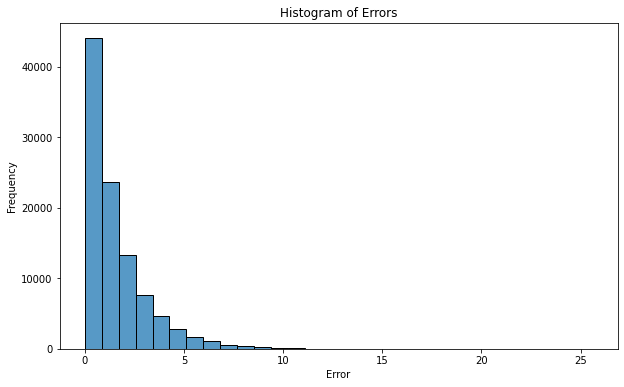

In [317]:
plt.figure(figsize=(10,6))

# Plotting a histogram using seaborn
sns.histplot(rmse_zsdchl, bins=30, kde=False)

# Adding title and labels
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# Displaying the plot
plt.show()

In [276]:
time_series

array([18.20567  , 16.731424 , 15.488216 , 16.734354 , 11.676031 ,
       12.681356 , 12.6813755, 14.062991 , 13.72064  , 12.370284 ,
       11.821481 ], dtype=float32)

In [272]:
results.keys()

dict_keys(['zsd', 'zsd_big', 'zsdchl', 'zsdkd'])

In [ ]:
rmse_list = []
for period in tqdm(random_periods):
    start, lat, lon = period
    time_series = subset['ZSD'][:, lat, lon].values[start:start+period_length]
    actual = time_series[-1]
    forecast = SeS_forecast(time_series[:-1])
    rmse = sqrt(mean_squared_error([actual], [forecast]))
    rmse_list.append(rmse)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [317]:
mean = (val_data['ZSD'].values > 0).mean()
std = (val_data['ZSD'].values > 0).std()

In [46]:
np.array(rmse_list).mean()

2.2148206661974745

In [305]:
np.array(rmse_list).mean()

1.3372922720596736

In [296]:
sarima_forecast(time_series[:-1])

/opt/conda/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


25.999688044888003